# Autores

Hugo Aranda Sánchez

Albert Ruiz Vives


# Imports e Instalaciones necesarias

In [13]:
#!pip install plotly --upgrade --user --quiet
#!pip install pandas --upgrade --user --quiet
#!pip install numpy --upgrade --user --quiet
#!pip install scipy --upgrade --user --quiet
#!pip install statsmodels --upgrade --user --quiet
#!pip install scikit-learn --upgrade --user --quiet
#!pip install missingno --upgrade --user --quiet
#!pip install apafib --upgrade  --quiet
#!pip install imblearn --upgrade --user --quiet
#!pip install dtreeviz --upgrade --user --quiet

In [14]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython.display import display, HTML
show_html = lambda html: display(HTML(html))

from time import time
from datetime import timedelta

init_time = time()

In [15]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from time import time
from datetime import timedelta
init_time = time()


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.__version__
from pandas.plotting import scatter_matrix
import missingno as msno


from sklearn import set_config

from sklearn.model_selection import train_test_split,  KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn import datasets

import warnings

from mpl_toolkits.mplot3d import Axes3D

from yellowbrick.regressor import AlphaSelection

from statsmodels.genmod.generalized_linear_model import GLM
import statsmodels.api as sm
from scipy import stats

sns.set()

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.precision', 3)

set_config(display='text')
warnings.filterwarnings('ignore')

'0.13.0'

# Credit Card Customers

## Como estan organizados los experimentos de este notebook

1. Discusión de elección de problema y extracción
2. Explicación de descubrimientos sobre el dataset mediante exploración
3. Prartición de datos
4. Descripción estadística básica
5. Visualización de datos
7. Preproceso (selección de variables finales, estandarización y Recodificación)
8. Visualización avanzada
9. Elección y ejecución del muestreo
10. Modelados completos lineales
    1. Regresión Lineal
    2. Naïve Bayes
    3. Lineal/Polinomial SVM
11. Modelados no-lineales
    1. BRF SVM
    2. Arboles de decision
    3. Gradient Boosting
    4. Random Forest

# 1. Discusión de elección de problema y extracción

## Discusión de elección del problema

Los humanos somos impredecibles en general, pero a través de la conducta y las observaciones podemos predecir un poco como actuaremos en el futuro. Esto es un gran recurso a explorar para las empresas que ofrecen servicios, pues les ineresa al máximo conocer y entender como los usuarios estan interactuando con su servicio para mejorarlo y mantenerse competitivos y relevantes.

En este marco se encuentra nuestro proyecto el cual hace uso de unos datos extraidos de de kaggle llamado Credit Card customers. El cual como su propio nombre indica contiene informacion relacionada con los clienes de un banco teniendo múltiples valores relacionados con su actividad en el mismo y el uso de sus trajetas de crédito.

Todo esto sera utilizado para predecir nuestra variable objetivo "Attrition_Flag" la cual nos indica si el usuario ha cerrado su tarjeta o no. Por lo tanto estamos frente a un problema de clasificación donde hemos de clasificar a los usuarios según si creemos que estos van a cancelar o no su cuenta de forma inminente.

Esto es bastante interesante a nivel empresarial puesto que a estas personas potencialmente descontentas o con ideas de nuevos proyectos en otro lugar necesitan una atención especial por parte de la empresa como medida disuasoria. 

## Importar datos
Los datos que trabajaremos a lo largo del proyecto parten de un [Kaggle](https://www.kaggle.com/datasets/sakshigoyal7/credit-card-customers) donde podemos encontrar el dataset

In [16]:
#cargamos los datos de los clientes del banco
bank_data = pd.read_csv('BankChurners.csv', delimiter=',')


#hacemos un head para ver un poco como es el formato de la tabla inicialmente
bank_data.head()


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,61.00
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,105.00
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.00
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.76
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.00


Podemos observar que tenemos 21 variables de las cuales 6 son categoricas, 1 identificativa y 14 númericas. Todas ellas giran entorno a distintos aspectos de interacción entre usuarios y su banco.

# 2. Explicación de descubrimientos sobre el dataset mediante exploración

Este es un problema popular dentro del Machine Learning así que podemos obtener datos relevantes sobre el estado de este problema en el mundo real a través de diferentes proyectos anteriores.

De estos principalmente podemos aprender como es común valorar los resultados de nuestros experimentes en el sector. Por ejemplo, en un artículo que trata sobre el tema podemos observar cómo para un dataset relativamente similar este naturalmente tiene un especial cuidado y atención por los falsos negativos pues desde el punto de vista empresarial estos son críticos. Esta idea formara parte de nuestro razonamiento para valorar los modelos de entre otros aspectos. También podemos ver que aspectos son importantes en general para representar la eficiencia en papers de este estilo.

También encontramos un artículo el cual contiene una valoración interesante del proyecto la cual nos permite afilar un poco que modelos sentimos interés por probar como por ejemplo modelos de Gradient Boosting, Suport Vector Machines y Bosques Aleatorios. Esto nos hace pensar que la no linealidad de los modelos es vital. Pues como mencionamos anteriormente, en un conjunto de datos como este puede haber muchos tipos diferentes de situaciones los cuales generan patrones complejos.

# 3. Separación entre test y train

Los datos de test para nosotros tienen una función exclusivamente de validación. Por lo tanto de ahora en adelante toda la visualización previa al preproceso solamente trabajaremos con la partición particular obtenida de forma estratíficada.

El uso de estratificación se debe a que tenemos un bajo porcentaje de usuarios que planean dejar el banco, y con una partición completamente aleatoria correriamos el riesgo de que al hacer la partición perder representación de los mismos.

<Axes: xlabel='Attrition_Flag'>

Text(0.5, 1.0, 'Distribución de Attrition_Flag')

Text(0.5, 0, 'Categorías')

Text(0, 0.5, 'Frecuencia')

(array([0, 1]),
 [Text(0, 0, 'Existing Customer'), Text(1, 0, 'Attrited Customer')])

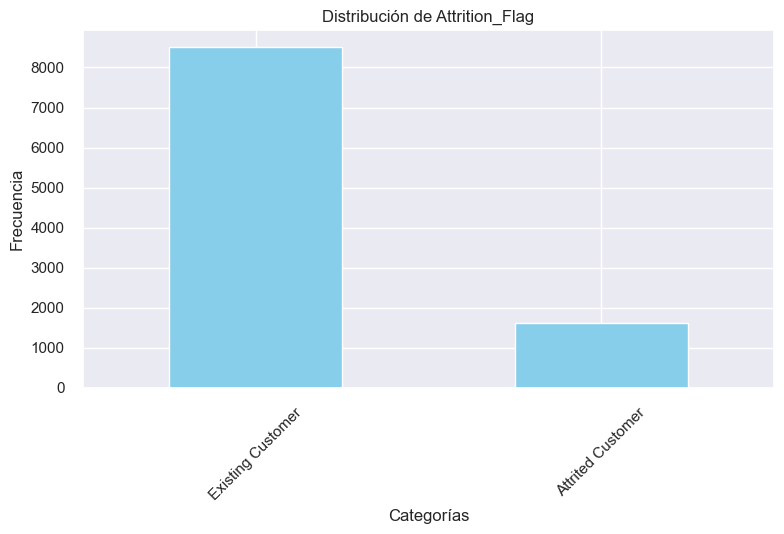

In [17]:
# Genera el gráfico de barras para la distribución de la columna categórica
bank_data['Attrition_Flag'].value_counts().plot(kind='bar', color='skyblue')

# Añade etiquetas y título al gráfico
plt.title('Distribución de Attrition_Flag')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)  # Rota las etiquetas del eje x para mejorar la legibilidad si es necesario

# Muestra el gráfico
plt.tight_layout()
plt.show()

In [18]:
cls = [str(v) for v in sorted(bank_data['Attrition_Flag'].unique())]
bank_data['Attrition_Flag'].value_counts()

bank_data['Attrition_Flag'] = bank_data['Attrition_Flag'].astype('category').cat.codes

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

In [19]:
#separamos en variable objetivo y features
X = bank_data.drop('Attrition_Flag', axis=1)
y = bank_data['Attrition_Flag']
    
#separamos de forma stratificada para asegurar que preservamos la proporción de objetivo
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

data_train = pd.concat([pd.DataFrame(X_train), y_train], axis=1)

In [20]:
data_train['Attrition_Flag'].value_counts()
data_train.head()

Attrition_Flag
1    6799
0    1302
Name: count, dtype: int64

,CLIENTNUM,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
1602,806407308,54,F,3,College,Single,Unknown,Blue,49,6,2,3,13184.0,0,13184.0,1.166,2047,33,179.00,0.00,0
7791,801786483,51,M,0,High School,Single,$80K - $120K,Blue,45,3,2,3,10648.0,2517,8131.0,708.000,4930,89,978.00,236.00,1
7177,779870883,45,F,4,High School,Single,$40K - $60K,Blue,29,3,2,1,4595.0,1781,2814.0,708.000,3746,68,545.00,388.00,1
97,720336708,53,M,3,Doctorate,Married,$40K - $60K,Blue,35,5,3,2,3789.0,1706,2083.0,1.047,1609,42,0.68,0.45,1
4820,716769783,48,F,2,Graduate,Married,Unknown,Blue,40,3,2,4,5104.0,736,4368.0,679.000,3943,78,696.00,144.00,1


# 4. Descripción estadística

Veamos un poco cómo son estos valores a nivel estadístico, podemos apreciar que valores como el número de dependientes, número de relaciones, meses inactivos etc. tienen valores muy pequeños con estandares pequeños mientras que valores como el límite de crédito, cantidad dispuesta a comprar etc. tienen valores y estandares muy altos con lo que tenemos diferentes escalas divisables a simple vista que tendremos que traatar durante el preprocessing.

In [21]:
# Selecting only the numerical columns
numerical_cols = data_train.select_dtypes(include=['int', 'float']).columns.tolist()

# Descriptive statistics for numerical variables
data_train[numerical_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,8101.0,7.392e+08,3.689e+07,7.081e+08,7.130e+08,7.179e+08,7.732e+08,8.283e+08
Customer_Age,8101.0,4.633e+01,7.986e+00,2.600e+01,4.100e+01,4.600e+01,5.200e+01,7.300e+01
Dependent_count,8101.0,2.351e+00,1.297e+00,0.000e+00,1.000e+00,2.000e+00,3.000e+00,5.000e+00
Months_on_book,8101.0,3.594e+01,7.957e+00,1.300e+01,3.200e+01,3.600e+01,4.000e+01,5.600e+01
Total_Relationship_Count,8101.0,3.821e+00,1.547e+00,1.000e+00,3.000e+00,4.000e+00,5.000e+00,6.000e+00
Months_Inactive_12_mon,8101.0,2.336e+00,1.002e+00,0.000e+00,2.000e+00,2.000e+00,3.000e+00,6.000e+00
Contacts_Count_12_mon,8101.0,2.450e+00,1.104e+00,0.000e+00,2.000e+00,2.000e+00,3.000e+00,6.000e+00
Credit_Limit,8101.0,8.636e+03,9.108e+03,1.438e+03,2.553e+03,4.549e+03,1.107e+04,3.452e+04
Total_Revolving_Bal,8101.0,1.162e+03,8.147e+02,0.000e+00,3.570e+02,1.279e+03,1.781e+03,2.517e+03
Avg_Open_To_Buy,8101.0,7.474e+03,9.107e+03,3.000e+00,1.335e+03,3.451e+03,9.885e+03,3.452e+04


También vemos que en lo que respecta a categoricas tenemos diversos tipos. Necesitaremos conocer estos para poder preprocesar y entender en cómo funcionan. Podemos ver que a excepción de algunos cuya recodificación será más arbitraria (género o estado marital), otros tipos de categóricos presentan un claro orden de menos a más estudios (education_level), de menos a mas dinero (income_category) o de menos a mas nivel de tarjeta (card_category). Todos estos podemos ver claramente que podrán ser codificados númericamente con una progresión sin perder las variables que explican.

In [22]:
# Selecting only the categorical columns
categorical_cols = data_train.select_dtypes(include='object').columns.tolist()

# Descriptive statistics for categorical variables
data_train[categorical_cols].describe(include='all').T

# Enumerating unique values for each categorical variable
for col in categorical_cols:
    unique_values = data_train[col].unique()
    print(f"Unique values for '{col}':")
    for index, value in enumerate(unique_values, start=1):
        print(f"{index}. {value}")
    print("\n")

,count,unique,top,freq
Gender,8101,2,F,4262
Education_Level,8101,7,Graduate,2442
Marital_Status,8101,4,Married,3755
Income_Category,8101,6,Less than $40K,2838
Card_Category,8101,4,Blue,7541


Unique values for 'Gender':
1. F
2. M


Unique values for 'Education_Level':
1. College
2. High School
3. Doctorate
4. Graduate
5. Unknown
6. Uneducated
7. Post-Graduate


Unique values for 'Marital_Status':
1. Single
2. Married
3. Divorced
4. Unknown


Unique values for 'Income_Category':
1. Unknown
2. $80K - $120K
3. $40K - $60K
4. Less than $40K
5. $120K +
6. $60K - $80K


Unique values for 'Card_Category':
1. Blue
2. Silver
3. Gold
4. Platinum





# 5. Visualización simple

## Variables numericas

Todas las variables a priori son relevantes y entre ellas tenemos algunas que parecen normales como la edad de los clientes o los meses que llevan de relacion y otras que no lo son en absoluto como los ratios los cuales tienen valores muy altos en el cero.

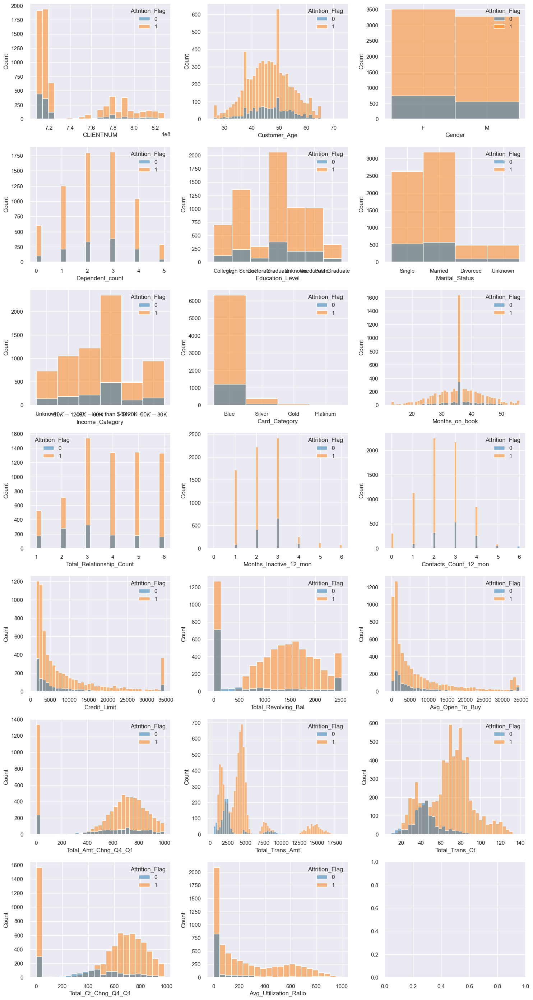

In [23]:
fig, axes = plt.subplots(7,3,figsize=(15,28))

X_train_frame = pd.DataFrame(X_train)
X_train_frame.columns=X.columns
for i, c in enumerate(X.columns):
    ax = axes.reshape(-1)[i]
    b = sns.histplot(x=c,data=X_train_frame,ax=ax, hue=y_train, palette='tab10')
plt.tight_layout()

Aquí podemos ver donde oscilan estos valores. Observamos también como se distribuyen los clientes que se van de los que se quedan con esas barras azules y naranjas. En algunos casos como la edad parece no haber una gran correlación pues siguen una distribución normal similar a la que siguen las columnas naranjas. Esto es cierto también para el número de dependientes y otras catégoricas. Dónde vemos distribuciones algo más diferentes que resultan interesantes es en el número de transacciones y la cantidad de dinero en las mismas. Parecen haber picos interesantes de clientes que se van en cuotas bajas cosa que tiene sentido pues un cliente que se va tendra una actividad disminuida en el banco.

In [24]:
data_train['Attrition_Flag'] = data_train['Attrition_Flag'].astype('category').cat.codes

## Estudio de Correlación


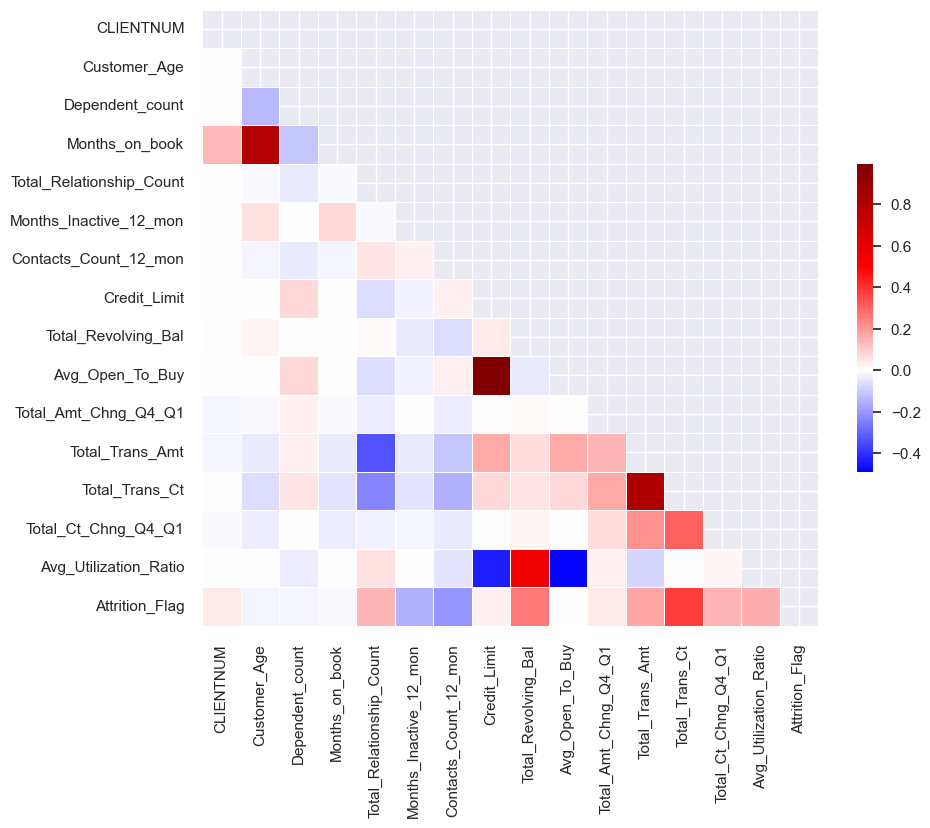

In [25]:
corr = data_train.corr(numeric_only=True)
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.subplots(figsize=(10, 8))
sns.heatmap(corr, mask=mask, cmap='seismic',  center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5});

Aquí podemos ver las diferentes correlaciones entre las variables númericas.

Cabe destacar que cuantos mas meses tienen contratados con el banco mas mayores son (los clientes lonjevos son mayores), el tamaño de las transacciones es inverso a la cantidad (o haces pocas muy grandes o muchas pequeas). La utilizacion esta inversamente relacionada con tu limite de credito y lo dispuesto que estas a comprar, mientras que esta directamente relacionada con el valor rotativo de la tarjeta. Finalmente, lo dispuesto que estas a comprar esta relacionado intimamente con el crédito.

Con attrition flag vemos que esta directamente relacionado con cualquier valor que implique actividad dentro del banco (como se podria esperar). Y esta inversamente relacionado con la inactividad. No se relaciona tanto con aspectos del estilo de vida del usuario cosa que tomaremos en cuenta a la hora de hacer descartes.

Las variables no son normales pero se acercan lo suficiente.

In [26]:
from scipy.stats import normaltest
print(normaltest(data_train['Customer_Age'], nan_policy='omit'))
print(normaltest(data_train['Dependent_count'], nan_policy='omit'))
print(normaltest(data_train['Months_on_book'], nan_policy='omit'))

NormaltestResult(statistic=34.92481977903793, pvalue=2.607184372208942e-08)
NormaltestResult(statistic=382.7047477193075, pvalue=7.883515642067607e-84)
NormaltestResult(statistic=59.27436819464497, pvalue=1.3450377930757448e-13)


En los boxplot podemos apreciar la necesidad de estandarizar pues tenemos tres tramos claros diferenciados en los cuales las variables van de valores muy altos a valores muy pequeños. Los outliers también nos motivan a tomar esa decision.

<Axes: >

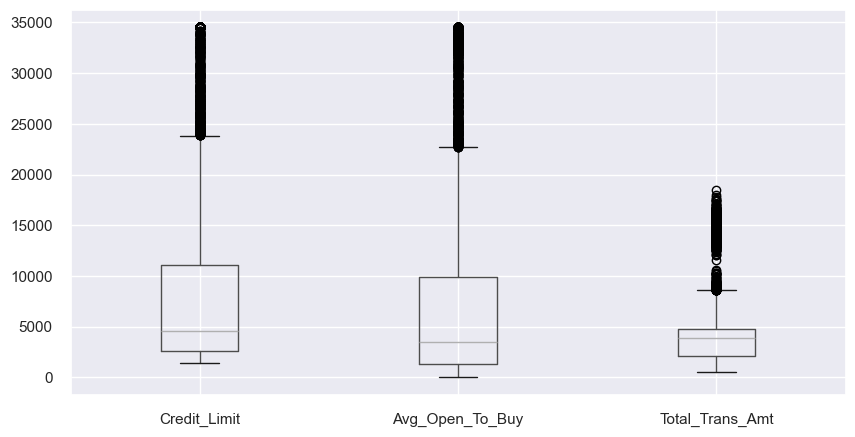

In [27]:
fig, ax = plt.subplots(figsize=(10,5))
data_big = ['Credit_Limit', 'Avg_Open_To_Buy', 'Total_Trans_Amt']
data_train[data_big].boxplot()

<Axes: >

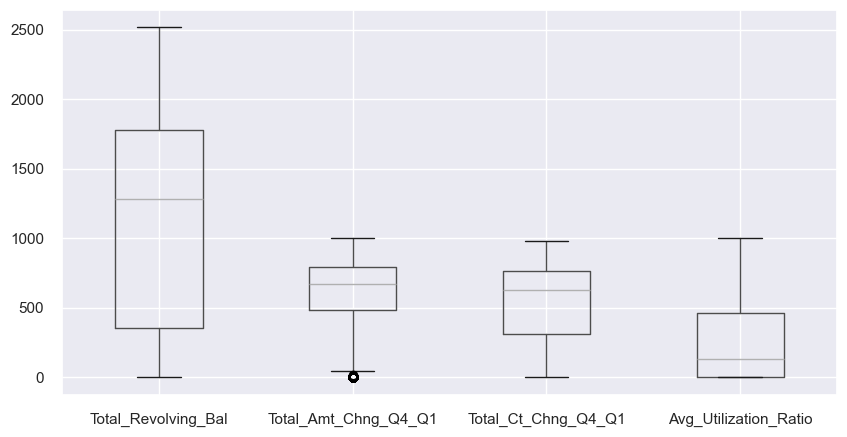

In [28]:
fig, ax = plt.subplots(figsize=(10,5))
data_mid = ['Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1',  'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
data_train[data_mid].boxplot()

<Axes: >

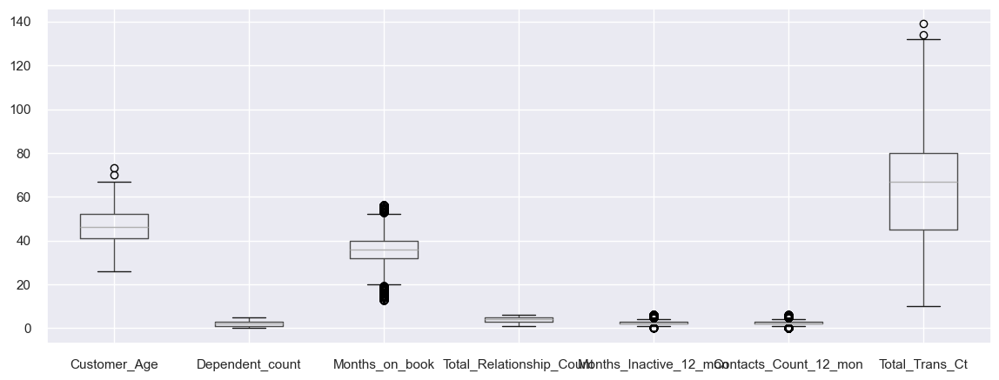

In [29]:
fig, ax = plt.subplots(figsize=(14,5))
data_small = [ 'Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count','Months_Inactive_12_mon', 'Contacts_Count_12_mon','Total_Trans_Ct',]
data_train[data_small].boxplot()

Finalmente tenemos las variables categoricas las cuales son el genero, el tipo de trabajo, el estado civil y el tipo de tarjeta. A priori en los violins nos e ve nada muy interesante pero podremos aprofundizar más en como esas se relacionan con las demás.

De momeno vemos que los usuarios platino esan principalmente en hombres de entre 40 y 50, que el factor de huida no tiene mucho que ver con el genero, el nivel de educación sorprendentemente tampoco afecta mucho y tendremos que preprocesar algunos unknowns.

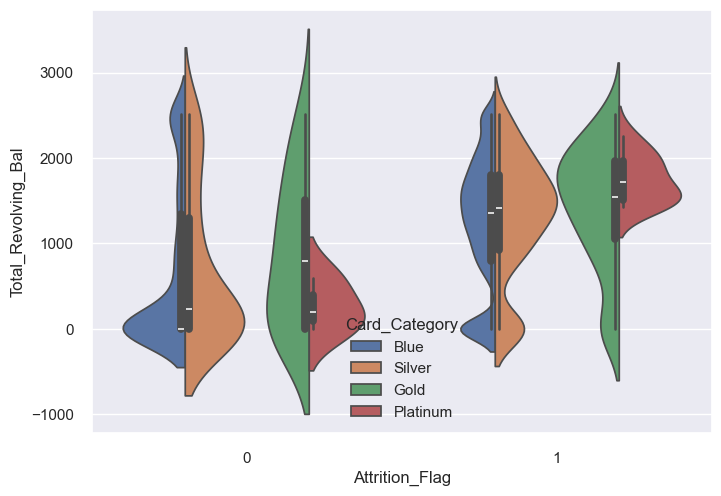

In [30]:
sns.violinplot(data=data_train, x="Attrition_Flag", y="Total_Revolving_Bal", hue="Card_Category", split=True);

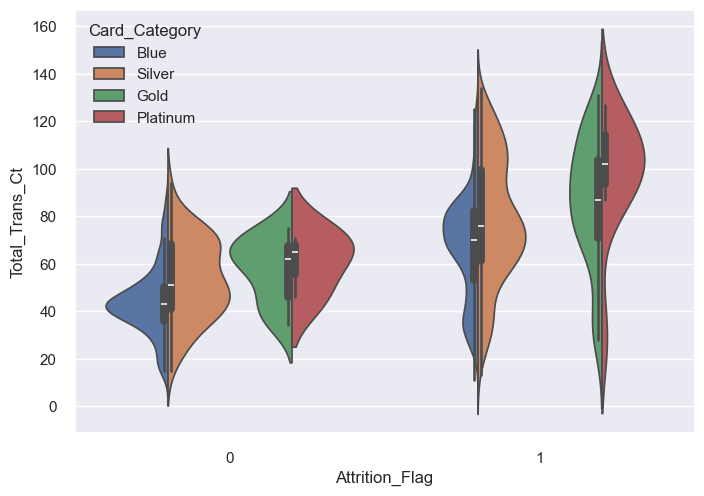

In [31]:
sns.violinplot(data=data_train, x="Attrition_Flag",  y="Total_Trans_Ct", hue="Card_Category", split=True);

# 6. Preprocessing 

Los principales retos a partir del preprocessing son la presencia de unas variables categoricas a ser recodificadas, las cuales deberan ser estudiadas. Esto junto a la estandarización de variables lo hacemos a posteriori de la visualización para ver si detectamos outliers o otras tendencias en los datos sin alterar.

En lo que respecta a preprocesado en otros aspectos el dataset se muestra bastante limpio, por ende solo elegiremos las variables finales y separaremos en test y train

## Elección de variables finales y descripción

El conjunto de datos ya esta bastante focalizado a lo que queremos estudiar que son los tipos de perfiles de clientes según su comportamiento para estudiar como esto afecta a la decisión de cerrar el servicio. Por ende a penas eliminaremos variables.

De todas las variables las que seleccionaremos (a parte de Attrition_Flag la cual es nuestra variable objetivo) son:

- Variables númericas
    - Total_Relationship_Count: Número de productos propiedad del cliente
    - Months_Inactive_12_mon: Meses inactivo en los últimos 12 meses
    - Contacts_Count_12_mon: Número de contratos en los últimos 12 meses
    - Total_Revolving_Bal: El saldo rotativo del cliente (cupo de crédito personal reutilizable).
    - Total_Amt_Chng_Q4_Q1: El cambio en el volumen de las transacciones
    - Total_Trans_Amt: El volumen de transacciones.
    - Total_Trans_Ct: La cantidad de transacciones (conteo)
    - Total_Ct_Chng_Q4_Q1: El cambio en el conteo de transacciones
    - Avg_Utilization_Ratio: El ratio de utilización
- Variables categóricas
    - Gender: género del propietario de la cuenta
    - Education_Level: Nivel de educación del cliente
    - Marital_Status: Estado marital del cliente
    - Income_Category: Categoría de ingresos del cliente
    - Card_Category: Categoria de tarjeta de crédito (Blue, Silver, Gold, Platinum)

### Variables Númericas 
En ellas encontramos valores relacionados con el estilo de vida de nuestros clientes, su edad (Customer_Age), su numero de personas dependientes a su cargo (Dependent_Count).

Y el resto vienen a ser temas relacionados más con el tipo de contrato que tienen dentro del banco y su actividad reciente cuantificada. Allí encontramos los meses que hace que sucedió esta relacion (Months_on_book), el numero de contratos que tiene (Total_Relationship_Count), el numero de meses que lleva inactivo (Months_Inactive_12_mon), el numero de contratos (Contract_Count_12_mon), el limite de credito que tiene puesto en la tarjeta (Credit_Limit), el saldo total rotativo en la tarjeta de crédito (Total_Revolving_Bal), lo que esta dispuesto a comprar (Avg_Open_To_Buy), el cambio en la suma de las transacciones entre trimestres (Total_Amt_Chng_Q4_Q1), el cambio en la cantidad numerica de las transacciones entre trimestres (Total_Ct_Chng_Q4_Q1), la cantidad transferida en los ultimos meses (Total_Trans_Amt), el numero de transacciones (Total_Trans_Ct) y finalmente el ratio de uso (Avg_Utilization_Ratio).

A priori estas 14 variables númericas parecían todas interesantes pero al investigar las correlaciones podemos destacar que de entre ellas hay cinco que no aportan correlación en los apartados que consideramos más interesantes. Estas son las relacionadas con el estilo de vida Customer_age y Dependent_Count las cuales no parecen significar mucho dentro del gran esquema de las cosas, pues parece más relevante las condiciones económicas que el resto de factores. En lo que respecta a Months_on_book, Credit_Limit y Avg_Open_To_Buy a pesar de estar relacionadas no parecen pesar lo suficiente.

### Variables Categóricas

Lo mismo se dice de las 5 categoricas las cuales todas expresan el estilo de vida del usuario y el tipo de servicio que tiene contratado. Todo datos vitales para predecir si este planea irse o no,

### Variables identificatorias

Eliminaremos la columna del número de cliente pues este es un identificador irrelveante que no mostrara ningún tipo de correlación ni resultado interesante para analizar.

In [32]:
X_train.drop(columns=['CLIENTNUM'], inplace=True)
X_test.drop(columns=['CLIENTNUM'], inplace=True)

X_train.drop(columns=['Customer_Age'], inplace=True)
X_test.drop(columns=['Customer_Age'], inplace=True)

X_train.drop(columns=['Dependent_count'], inplace=True)
X_test.drop(columns=['Dependent_count'], inplace=True)

X_train.drop(columns=['Months_on_book'], inplace=True)
X_test.drop(columns=['Months_on_book'], inplace=True)

X_train.drop(columns=['Credit_Limit'], inplace=True)
X_test.drop(columns=['Credit_Limit'], inplace=True)

X_train.drop(columns=['Avg_Open_To_Buy'], inplace=True)
X_test.drop(columns=['Avg_Open_To_Buy'], inplace=True)

## Recodificación

Recodificaremos todas aquellas variables que nos parecen relevantes para tratar de incluirlas en aquellos modelos que precisan de variables númericas para funcionar.

In [33]:
X_train['Gender'] = X_train['Gender'].map({'M':0, 'F':1})
X_test['Gender'] = X_test['Gender'].map({'M':0, 'F':1})

education_mapping = {
    'Unknown': None,  
    'Uneducated': 0,
    'High School': 1,
    'College': 2,
    'Graduate': 3,
    'Post-Graduate': 4,
    'Doctorate': 5
}

X_train['Education_Level'] = X_train['Education_Level'].map(education_mapping)
X_test['Education_Level'] = X_test['Education_Level'].map(education_mapping)

income_mapping = {
    'Unknown': None, 
    'Less than $40K': 1,
    '$40K - $60K': 2,
    '$60K - $80K': 3,
    '$80K - $120K': 4,
    '$120K +': 5
}

X_train['Income_Category'] = X_train['Income_Category'].replace(income_mapping)
X_test['Income_Category'] = X_test['Income_Category'].replace(income_mapping)

marital_mapping = {
    'Unknown': None, 
    'Single': 1,
    'Married': 2,
    'Divorced': 3
}

X_train['Marital_Status'] = X_train['Marital_Status'].replace(marital_mapping)
X_test['Marital_Status'] = X_test['Marital_Status'].replace(marital_mapping)

card_mapping = {
    'Blue': 1,
    'Silver': 2,
    'Gold': 3,
    'Platinum': 4
}

X_train['Card_Category'] = X_train['Card_Category'].replace(card_mapping)
X_test['Card_Category'] = X_test['Card_Category'].replace(card_mapping)

## Missings

A nivel de missings algunas categóricas podemos ver que presentan un campo unknown el cual imputaremos con knn. Para ser más certero lo que haremos es hacer la imputación sobre el conjunto de train y después aplicarla sobre el de test. Pues si realizamos la imputación sobre todo corremos riesgo de sufrir data leakage.

<Axes: >

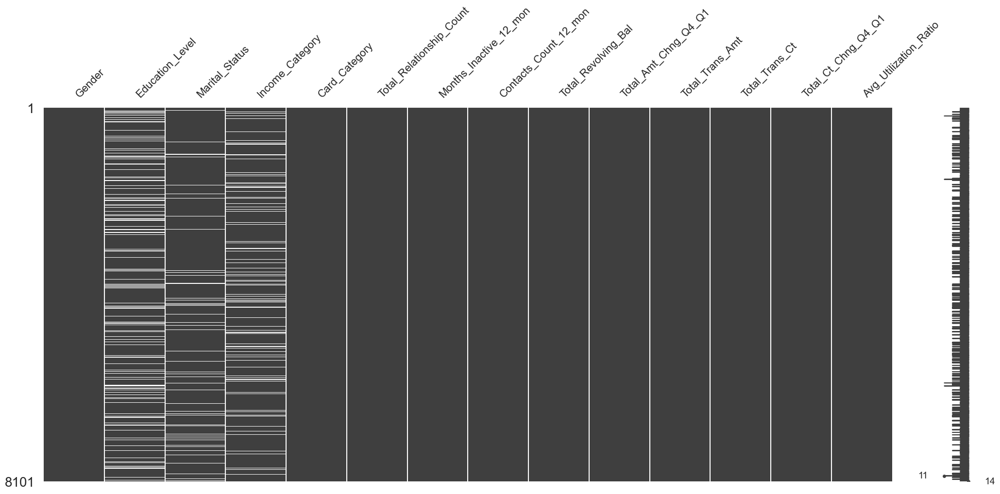

In [34]:
msno.matrix(X_train)

In [35]:
from sklearn.impute import KNNImputer

# Create a KNNImputer (with k=5 or any preferred number)
imputer = KNNImputer(n_neighbors=5)

# Columns with missing values
columns_with_missing = ['Education_Level', 'Marital_Status', 'Income_Category']

# Fit KNNImputer on X_train and transform both X_train and X_test
X_train_imputed = X_train.copy()
X_test_imputed = X_test.copy()

X_train_imputed[columns_with_missing] = imputer.fit_transform(X_train_imputed[columns_with_missing])
X_test_imputed[columns_with_missing] = imputer.transform(X_test_imputed[columns_with_missing])

X_train = X_train_imputed.copy()
X_test = X_test_imputed.copy()

<Axes: >

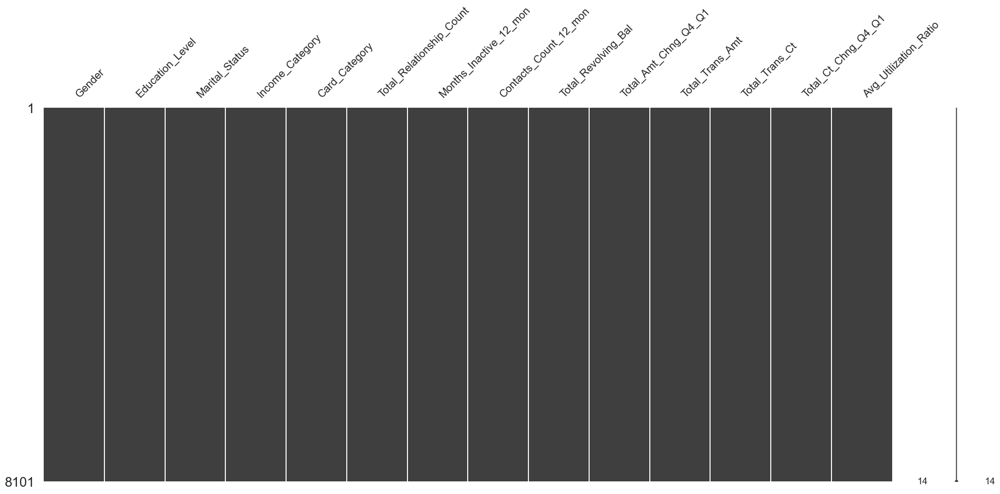

In [36]:
msno.matrix(X_train)

## Estandarización

Como vemos que hay valores muy dispares de entre las variables y sabemos que esto podría desequilibrar ciertos modelos haciendo que los resultados sean peores estandarizaremos todas las variables para que todas tengan un estandar similar y sean equiparables. De otra forma hay magnitudes como el dinero en cuenta que son numeros potencialmente altísimos (con outliers que afectan a nuestra eficiencia) y otras variables como gender que solo tienen dos estados 0 o 1.

In [37]:
X_train_sd = X_train.copy()
X_test_sd = X_test.copy()
sc = StandardScaler()
X_train_sd[X_train.columns] =  sc.fit_transform(X_train)
X_test_sd[X_test.columns] =  sc.transform(X_test)
X_train_sd.describe().T

,count,mean,std,min,25%,50%,75%,max
Gender,8101.0,-8.420e-17,1.0,-1.054,-1.054,0.949,0.949,0.949
Education_Level,8101.0,2.675e-16,1.0,-1.547,-0.798,-0.050,0.699,2.196
Marital_Status,8101.0,-2.794e-16,1.0,-1.101,-1.101,0.567,0.567,2.235
Income_Category,8101.0,2.772e-16,1.0,-1.034,-1.034,-0.268,0.498,2.031
Card_Category,8101.0,-2.289e-16,1.0,-0.253,-0.253,-0.253,-0.253,8.808
Total_Relationship_Count,8101.0,1.333e-16,1.0,-1.824,-0.531,0.116,0.762,1.409
Months_Inactive_12_mon,8101.0,1.417e-16,1.0,-2.330,-0.335,-0.335,0.663,3.656
Contacts_Count_12_mon,8101.0,4.210e-17,1.0,-2.219,-0.408,-0.408,0.498,3.216
Total_Revolving_Bal,8101.0,-9.473e-17,1.0,-1.427,-0.989,0.143,0.759,1.663
Total_Amt_Chng_Q4_Q1,8101.0,1.973e-17,1.0,-1.845,-0.294,0.324,0.700,1.369


# 7. Visualización Avanzada

## PCA



In [38]:
from sklearn.decomposition import PCA
myPCA = PCA().fit(X_train_sd);

print(myPCA.explained_variance_ratio_)
print()
print(myPCA.explained_variance_ratio_.cumsum())

[0.15998518 0.14116239 0.10306698 0.07391281 0.07306401 0.0722589
 0.06983718 0.06801711 0.06676142 0.06379842 0.05161998 0.02534276
 0.0190709  0.01210195]

[0.15998518 0.30114757 0.40421455 0.47812735 0.55119137 0.62345027
 0.69328745 0.76130457 0.82806599 0.89186441 0.94348439 0.96882715
 0.98789805 1.        ]


A priori viendo la varianza explicada por los componentes vemos que nuestro problema presenta una alta dimensionalidad, necesitamos al menos unos 10-11 componentes para explicar su varianza en mayoria (más de un 90%). Esto nos hace pensar que la visualización en dos y tres dimensiones con los componentes principales no será muy ilustrativa.

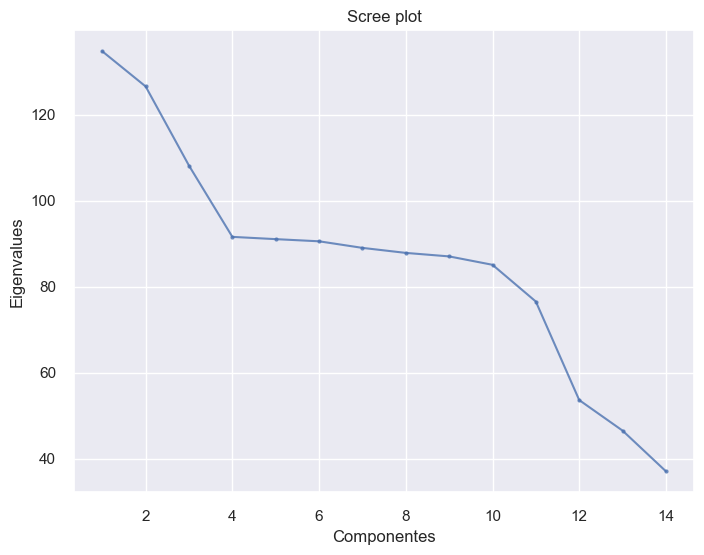

In [39]:
fig = plt.figure(figsize=(8,6));
plt.plot(range(1,len(myPCA.singular_values_ )+1),myPCA.singular_values_ ,alpha=0.8,marker='.');
y_label = plt.ylabel('Eigenvalues');
x_label = plt.xlabel('Componentes');
plt.title('Scree plot');

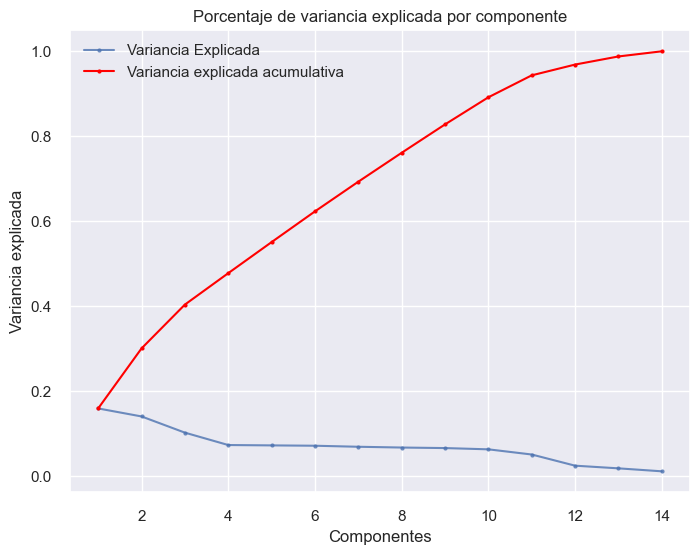

In [40]:
fig = plt.figure(figsize=(8,6));
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),myPCA.explained_variance_ratio_ ,alpha=0.8,marker='.',label="Variancia Explicada");
y_label = plt.ylabel('Variancia explicada');
x_label = plt.xlabel('Componentes');
plt.plot(range(1,len(myPCA.explained_variance_ratio_ )+1),
         np.cumsum(myPCA.explained_variance_ratio_),
         c='red',marker='.',
         label="Variancia explicada acumulativa");
plt.legend();
plt.title('Porcentaje de variancia explicada por componente');

Aquí podemos ver con mayor detalle esta variancia explicada de mejor manera y vemos que no hay ningun codo particular en el que se vea un pico en la varianza explicada por los componentes.

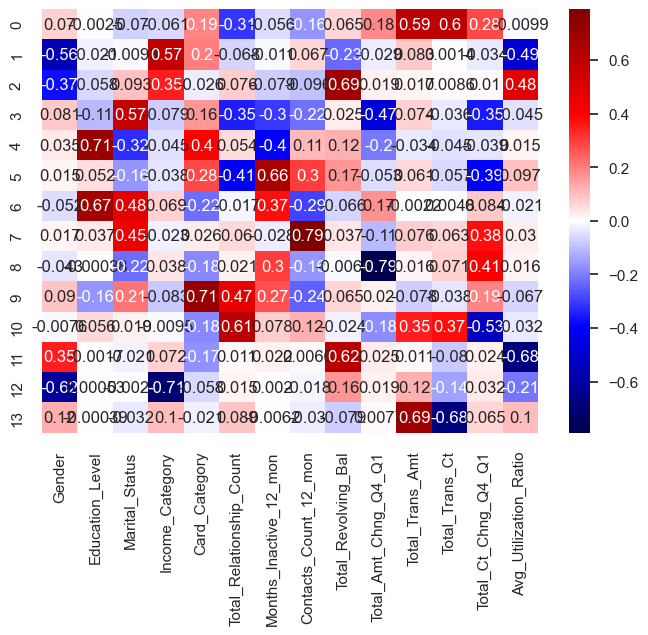

In [41]:
sns.heatmap(myPCA.components_, cmap='seismic',
            xticklabels=list(X_train.columns),
            vmin=-np.max(np.abs(myPCA.components_)),
            vmax=np.max(np.abs(myPCA.components_)),
            annot=True);

Explorando que variables aportan a cada componente podemos apreciar que PC1 no parece tener mucha relación con las variables que se correlacionan con la variable objetivo. Esto nos hace pensasr que a lo largo de PC1 serán indistinguibles los usuarios que se van de los que se quedan. Este componente principal almacena en su mayoria valores del estilo de vida que no son muy relevantes y los aspectos del banco que almacena son con diferencia los que menos correlacion presentaban, el límite de credito y el avg_open_to_buy. El segundo componente si que nos explica la vairanza de variables muy importantes como el total de transaciones y el dinero que hay en ellas de media. En PC3 tienen mucho peso variables moderadamente correlacionadas así que también podremos ver algo de interés.

<Axes: >

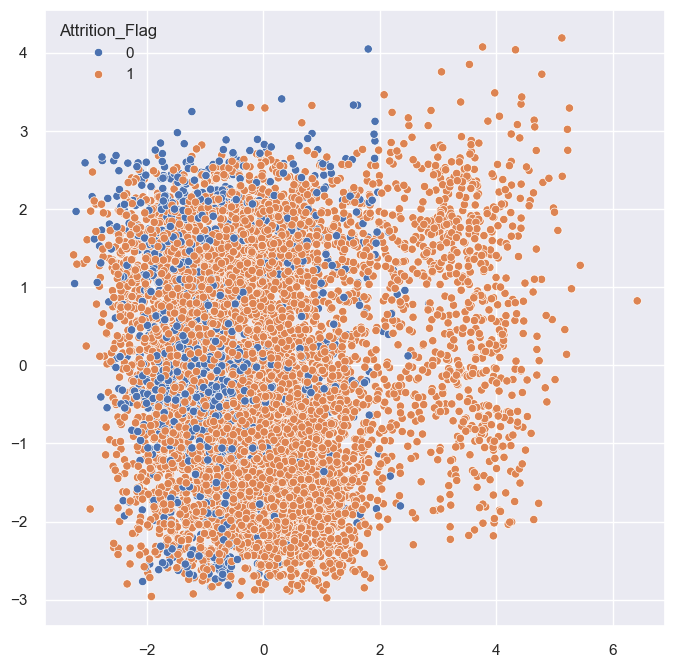

In [42]:
transformed_data = myPCA.transform(X_train_sd[X_train.columns])
fig = plt.figure(figsize=(8,8))
sns.scatterplot(x=transformed_data[:,0], y=transformed_data[:,1], hue=y_train)

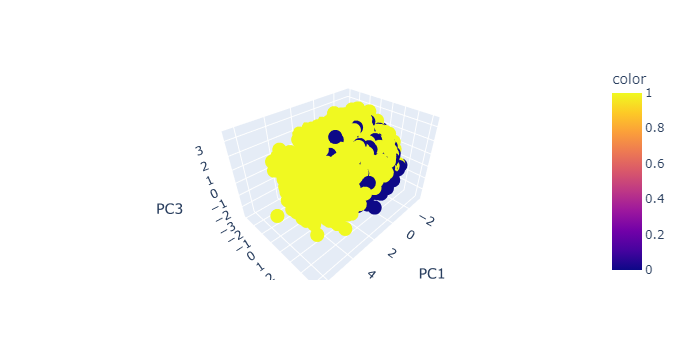

In [43]:
import plotly.express as px
pcs = X_train_sd.copy()
pcs[['PC1','PC2', 'PC3']] = transformed_data[:,:3]
fig = px.scatter_3d(pcs, x='PC1', y='PC2', z='PC3',
              color=y_train)
fig.show()

En los plots podemos ver lo que ya veníamos esperando, la visualización no es de lo más ilustrativa y el componente principal más importante es el PC2 pues almacena la variancia que nos aporta más en nuestra labor.

Tras hacer el PCA podemos ver que nuestros datos presentan una serie de fronteras no lineales algo borrosas las cuales no son el fuerte del PCA. Por ello ahora probaremos a visualizar con modelos no lineal. Además de esto presentan alta dimensionalidad, por necesitar de 10 componentes para explicar solamente un 80%.

Esto nos hace pensar que los modelos no lineales probablemente sean capaces de encontrar mejor los patrones que aquellos que trabajen con elementos lineales. Esta hipotesis la contrastaremos en fases más tardías de la experimentación.

## T-SNE

Cómo no hemos sido capaces de discernir ningún patrón haciendo uso de PCA (el cúal principalmente trat de observar correlaciones lineales entre los datos) vamos a emplear formas de visualización más capaces de proyectar datos con alta dimensionalidad y sean capaces de tratar relaciones no lineales. 

En esta categoría encontramos T-SNE. Este es capaz de capturar estructuras más complejas y funciona mapeando los datos de alta dimensionalidad en un espacio 2D y 3D (probaremos ambos). De esta manera puntos cercanos en espacios de alta dimensionalidad lo estarán en este nuevo espacio. Esto nos permite observar estructuras que van más allá de las relaciones lineales y potencilamente observaremos patrones que no son evidentes en dimensiones más altas.

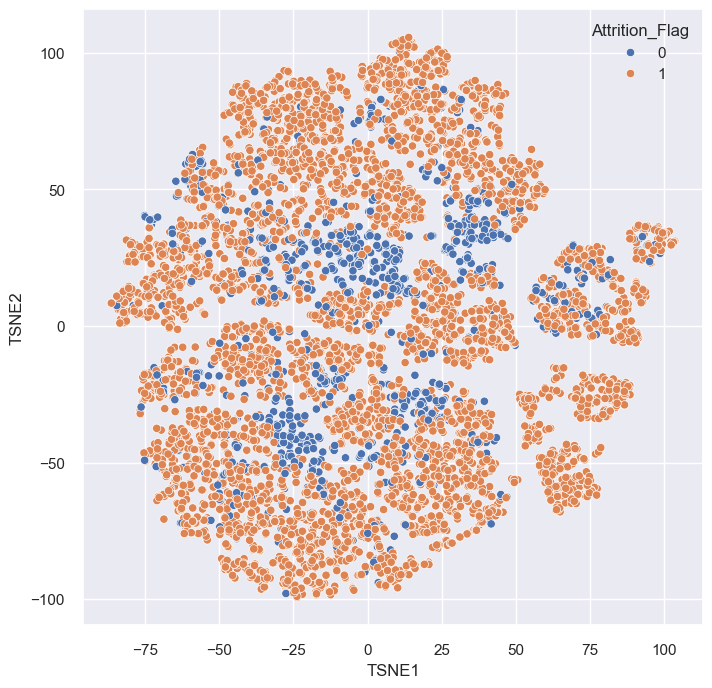

In [44]:
from sklearn.manifold import TSNE
tsne_standardized = X_train_sd.copy()
tsne_standardized2 = X_train_sd.copy()
test_tsne = TSNE(n_components=2, perplexity=10,n_iter=1000, init='random').fit_transform(X_train_sd)
tsne_standardized[['TSNE1','TSNE2']] = test_tsne
fig = plt.figure(figsize=(8,8))
sns.scatterplot(x='TSNE1', y='TSNE2', hue=y_train, data=tsne_standardized);

A pesar de que claramente sigue habiendo bastante difusión a lo largo de todo el gáfico pero claramente podemos ver sectores donde se aglomeran los clientes que se van y secciones donde se aglomeran los clientes que se quedan. Si bien se presentan siempre algo de contaminación cruzada aquí se ven algunos clusters más claros que antes. Esto nos hace pensar que probablemente métodos no lineales supondrán un salto claro en eficiencia.

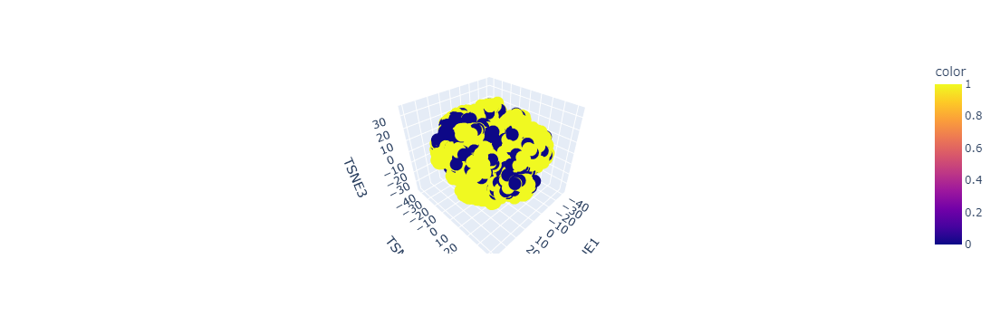

In [45]:
test_tsne = TSNE(n_components=3, perplexity=10,n_iter=3000, init='random').fit_transform(X_train_sd)
tsne_standardized2[['TSNE1','TSNE2','TSNE3']]=test_tsne
fig = px.scatter_3d(tsne_standardized2, x='TSNE1', y='TSNE2', z='TSNE3',
              color=y_train)
fig.show()

Adicionalmente probamos a partir de los datos de PCA para generar la visualización de T-SNE. Esto  nos permite ver algunos clusters mas claros que antes no capturabamos.

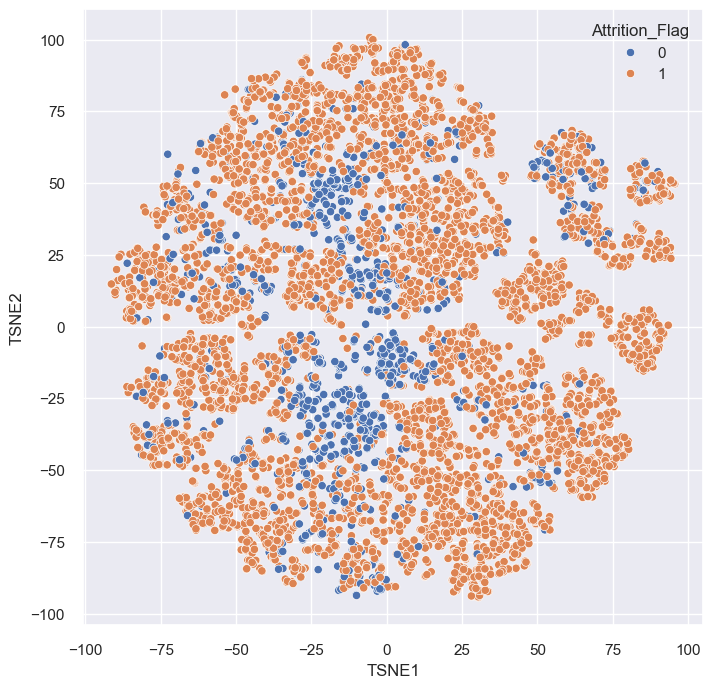

In [46]:
tsne_standardized_pca = X_train_sd.copy()
tsne_standardized_pca2 = X_train_sd.copy()
test_tsne_pca = TSNE(n_components=2, perplexity=10,n_iter=1000, init='pca').fit_transform(X_train_sd)
tsne_standardized_pca[['TSNE1','TSNE2']] = test_tsne_pca
fig = plt.figure(figsize=(8,8))
sns.scatterplot(x='TSNE1', y='TSNE2', hue=y_train, data=tsne_standardized_pca);

## Isomap

Reconstruction error: 18.22723030035436


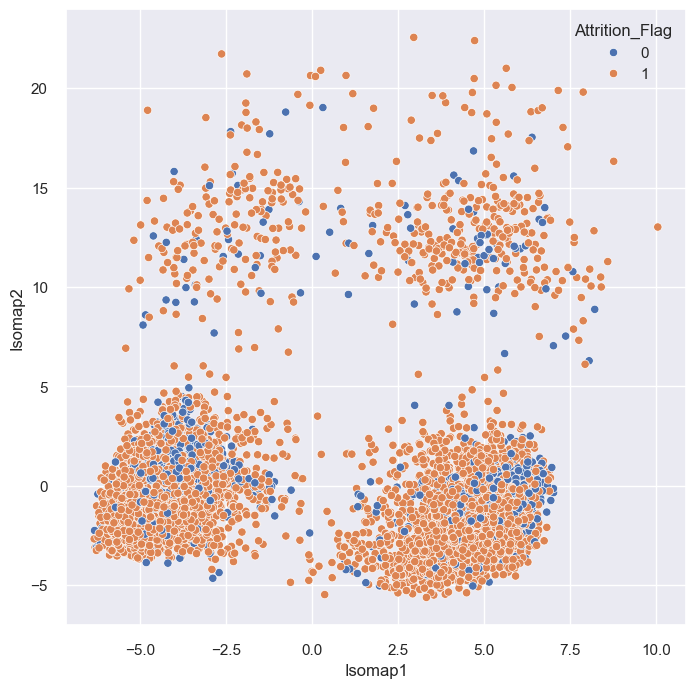

In [48]:
from sklearn.manifold import Isomap
dummy = X_train_sd.copy()
isomap = Isomap(n_components=2,n_neighbors=10)
bank_isomap = isomap.fit_transform(X_train_sd)
dummy[['Isomap1','Isomap2']]=bank_isomap
print('Reconstruction error:', isomap.reconstruction_error())
fig = plt.figure(figsize=(8,8))
sns.scatterplot(x='Isomap1', y='Isomap2', hue=y_train, data=dummy);

# 8. Elección y ejecución de muestreo

Ahora haremos una selección de remuestreo de nuestros datos para el uso de los mismos por nuestros modelos. Para realizarlo tendremos en cuenta todo lo descubierto hasta la fecha y un poco las necesidades de nuestros futuros modelos.

Como hemos mencionado anteriormente en la partición de los datos al trabajar con un conjunto de datos desequilibrado, donde una clase de clasificación representa un porcentaje significativamente menor que otra, es fundamental utilizar estrategias de validación cruzada que preserven la proporción de clases en cada pliegue. 

Por eso mismo usaremos Sratified K Fold el cual realizara esa partición preservando la proporcion de clases. Además de esta manera podemos evitar sobreestimar o subestimar ciertos aspectos pues si las proporciones son tan justas un mal corte puede hacer quedar muy mal a nuestro modelo cuando realmente no tiene problemas en particiones mejor representadas.

Escogemos 5 folds pues ya son suficientes para poder probar diferentes configuraciones. Shuffle se queda activado para mezclar los datos antes de dividirlos de manera que evitemos patrones específicos de la secuencia de los datos.

In [271]:
from sklearn.model_selection import StratifiedKFold

from sklearn.inspection import permutation_importance

from sklearn.metrics import confusion_matrix,  roc_auc_score

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

def save_results(clf, X_test, y_test, nclf, df):
    # Calcula la matriz de confusión
    y_pred = clf.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)

    # Calcula y guarda los valores relevantes
    df.loc[nclf,'test acc'] = accuracy_score(y_test, y_pred)
    df.loc[nclf,'precision score (W)'] = precision_score(y_test, y_pred, average='weighted')
    df.loc[nclf,'recall score (W)'] = recall_score(y_test, y_pred, average='weighted')
    df.loc[nclf,'f1 score (W)'] = f1_score(y_test, y_pred, average='weighted')
    if "SVM" in nclf:
        df.loc[nclf,'ROC AUC'] = None;
    else: 
        df.loc[nclf,'ROC AUC'] = roc_auc_score(y_test, clf.predict_proba(X_test)[:,1])

    # Obtiene los valores de la matriz de confusión por separado
    tn, fp, fn, tp = cm.ravel()

    # Guarda los valores en el DataFrame
    df.loc[nclf, 'True Positives'] = tp
    df.loc[nclf, 'False Positives'] = fp
    df.loc[nclf, 'False Negatives'] = fn
    df.loc[nclf, 'True Negatives'] = tn

    return df

def print_importance(model, X_test, y_test, name):
    perm_importance = permutation_importance(model, X_test, y_test, n_repeats=30, random_state=42)
    # Get feature importance scores
    feature_names = X_test.columns
    sorted_idx = perm_importance.importances_mean.argsort()
    sorted_features = [feature_names[i] for i in sorted_idx]
    importance_values = perm_importance.importances_mean[sorted_idx]
    
    # Plotting the coefficients
    plt.figure(figsize=(10, 6))
    plt.barh(sorted_features, importance_values, color='purple')
    plt.xlabel('Coefficient Magnitude')
    plt.title('Coefficients of ' + name)
    plt.show()


results_df = pd.DataFrame()

niter = 15

# 9. Modelos lineales Completos

## Naïve Bayes

In [272]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import  ConfusionMatrixDisplay,\
                  classification_report,  RocCurveDisplay, PrecisionRecallDisplay,\
                    accuracy_score, f1_score, precision_score, recall_score
gnb = GaussianNB()
print(np.mean(cross_val_score(gnb,X_train_sd,y_train,cv=stratified_kfold)))

0.8769278984927762


In [273]:
gnb_model = GaussianNB().fit(X_train_sd, y_train)

print('Priors:', gnb_model.class_prior_)
print('Means:\n')
means =pd.DataFrame(gnb_model.theta_)
means.columns=X_train_sd.columns
means

Priors: [0.1607209 0.8392791]
Means:



,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0.092,0.038,-0.029,-0.016,-2.620e-03,-0.330,0.358,0.476,-0.592,-0.104,-0.400,-0.861,-0.334,-0.366
1,-0.018,-0.007,0.006,0.003,5.017e-04,0.063,-0.069,-0.091,0.113,0.020,0.077,0.165,0.064,0.070


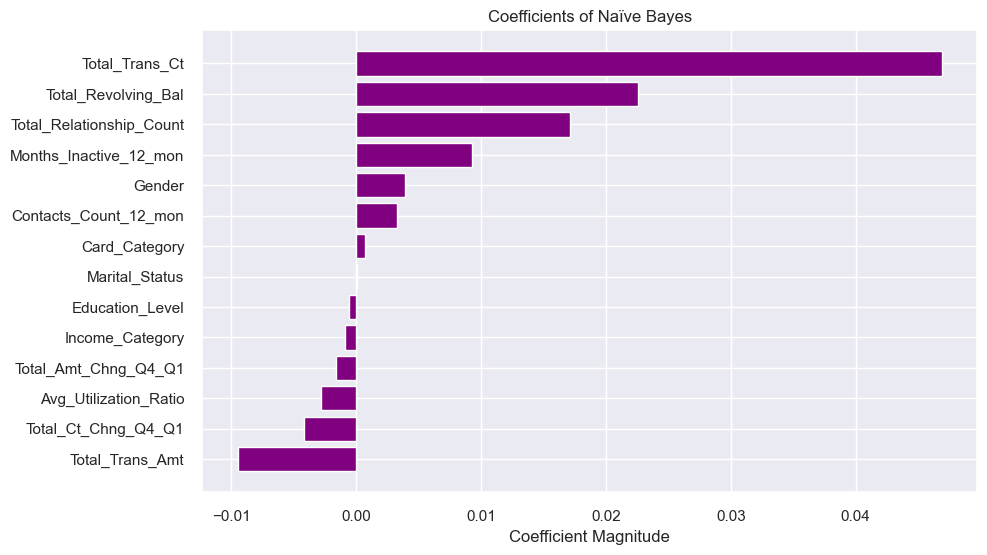

In [274]:
print_importance(gnb_model, X_test_sd, y_test, 'Naïve Bayes')

In [275]:
print(classification_report(gnb_model.predict(X_test_sd), y_test,target_names=['Attrited Customer', 'Existing Customer']))
results_df = save_results(gnb_model, X_test_sd, y_test, 'GNB', results_df)

                   precision    recall  f1-score   support

Attrited Customer       0.59      0.59      0.59       324
Existing Customer       0.92      0.92      0.92      1702

         accuracy                           0.87      2026
        macro avg       0.75      0.76      0.76      2026
     weighted avg       0.87      0.87      0.87      2026



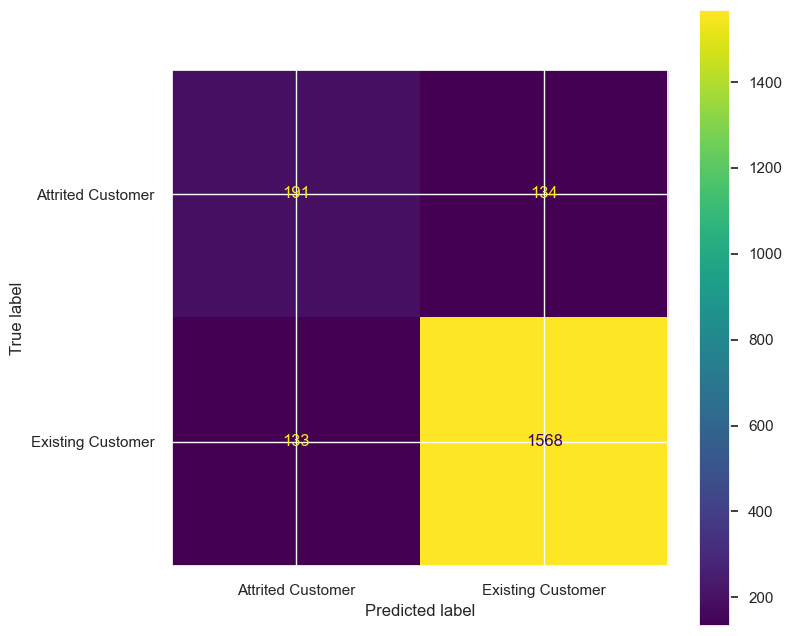

In [276]:
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(gnb_model, X_test_sd,y_test, display_labels=['Attrited Customer', 'Existing Customer'], ax=plt.subplot());

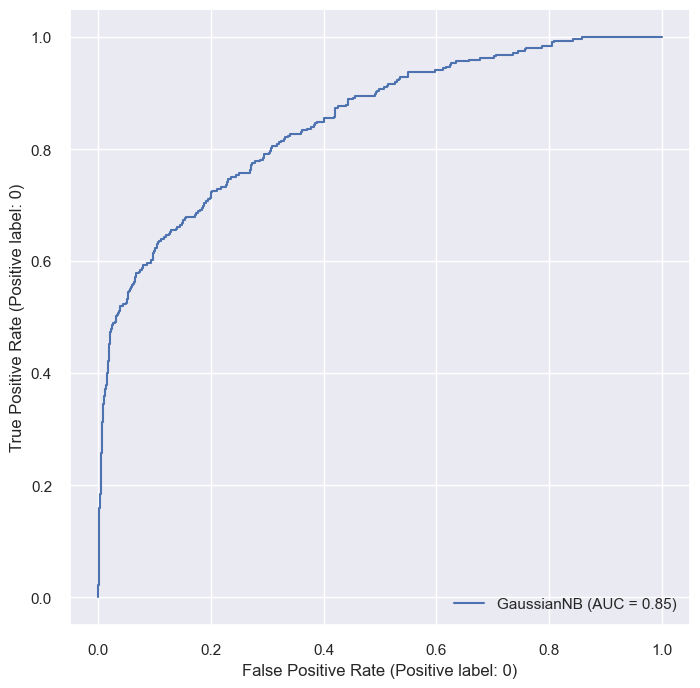

In [277]:
plt.figure(figsize=(8,8));
RocCurveDisplay.from_estimator(gnb_model, X_test_sd,y_test, pos_label=0, ax=plt.subplot());

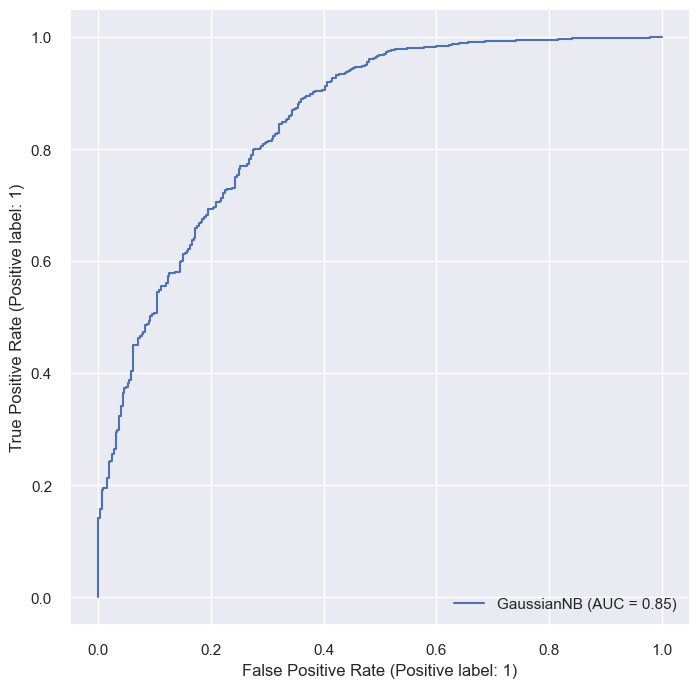

In [278]:
plt.figure(figsize=(8,8));
RocCurveDisplay.from_estimator(gnb_model, X_test_sd,y_test, pos_label=1, ax=plt.subplot());

## Regresión Logística

In [279]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
lr= LogisticRegression(max_iter=10000)
param = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': 10**np.linspace(-3, 3, 21, endpoint=True),
    'solver': ['liblinear', 'saga', 'lbfgs']  # Adjust solvers based on penalty choice
}
lr_gs =  GridSearchCV(lr,param,cv=stratified_kfold, n_jobs=-1, refit=True)
lr_gs.fit(X_train_sd, y_train);

<Figure size 1000x600 with 0 Axes>

<BarContainer object of 14 artists>

Text(0.5, 0, 'Coefficient Magnitude')

Text(0.5, 1.0, 'Coefficients of Logistic Regression')

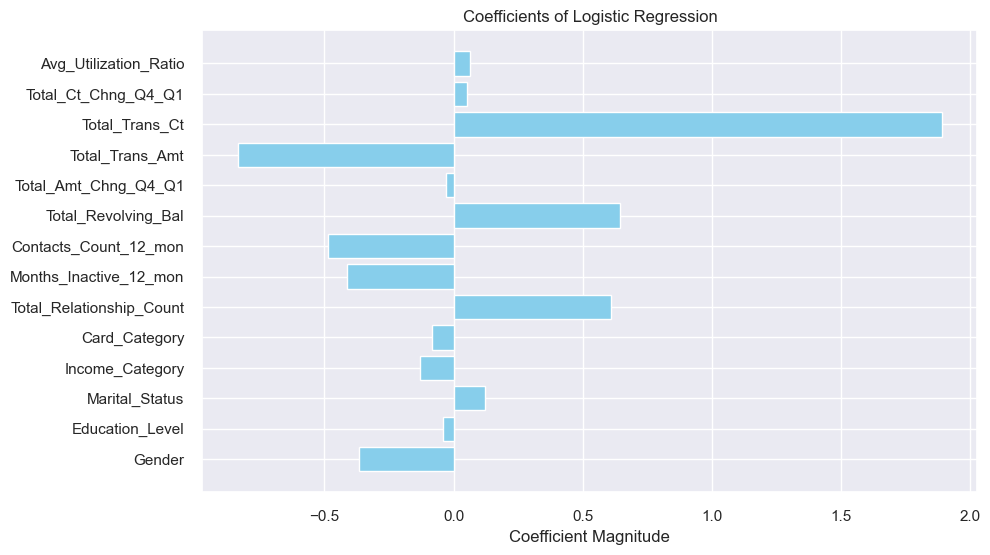

In [280]:
best_estimator = lr_gs.best_estimator_

# Retrieve coefficients and feature names from the best estimator
coefficients = best_estimator.coef_[0]

feature_names = X_train_sd.columns

# Plotting the coefficients
plt.figure(figsize=(10, 6))
plt.barh(feature_names, coefficients, color='skyblue')
plt.xlabel('Coefficient Magnitude')
plt.title('Coefficients of Logistic Regression')
plt.show()

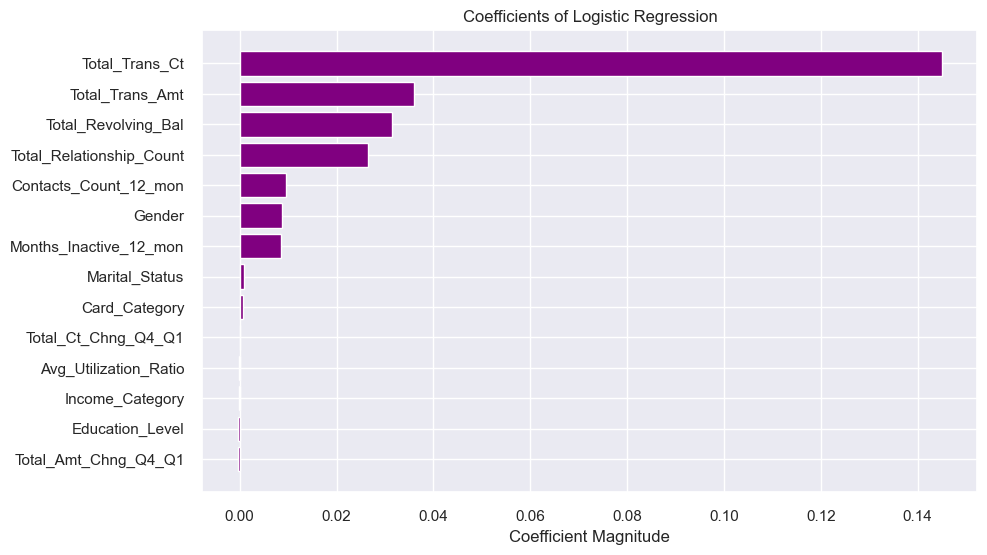

In [281]:
print_importance(lr_gs, X_test_sd, y_test, 'Logistic Regression')

In [282]:
show_html(pd.DataFrame(lr_gs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

,params,mean_test_score,rank_test_score
48,"{'C': 0.03162277660168379, 'penalty': 'l2', 'solver': 'liblinear'}",0.894,1
50,"{'C': 0.03162277660168379, 'penalty': 'l2', 'solver': 'lbfgs'}",0.893,2
49,"{'C': 0.03162277660168379, 'penalty': 'l2', 'solver': 'saga'}",0.893,2
158,"{'C': 125.89254117941663, 'penalty': 'l2', 'solver': 'lbfgs'}",0.893,4
120,"{'C': 7.943282347242813, 'penalty': 'l2', 'solver': 'liblinear'}",0.893,4


In [283]:
print(classification_report(lr_gs.predict(X_test_sd), y_test,target_names=['Attrited Customer', 'Existing Customer']))
results_df = save_results(lr_gs, X_test_sd, y_test, 'Logistic', results_df)

                   precision    recall  f1-score   support

Attrited Customer       0.48      0.79      0.60       200
Existing Customer       0.97      0.91      0.94      1826

         accuracy                           0.90      2026
        macro avg       0.73      0.85      0.77      2026
     weighted avg       0.93      0.90      0.91      2026



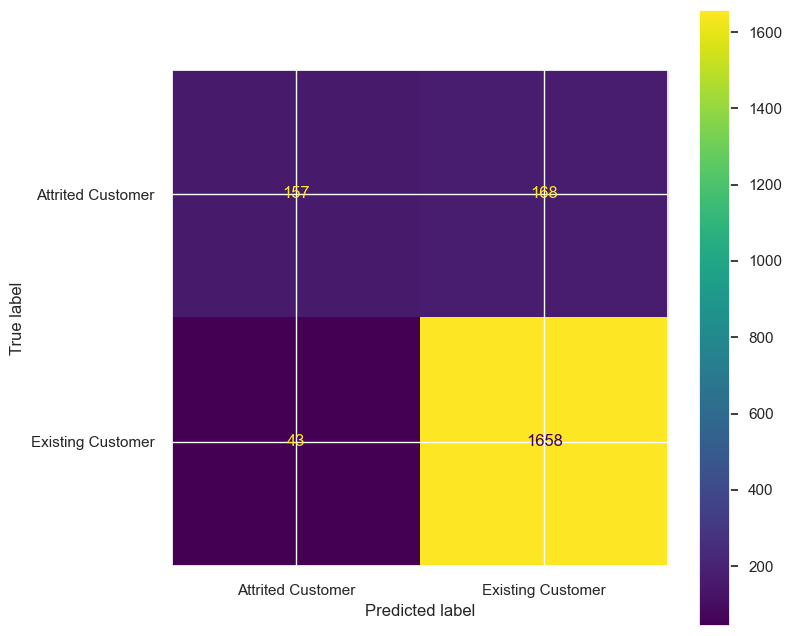

In [284]:
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(lr_gs, X_test_sd,y_test, display_labels=['Attrited Customer','Existing Customer'], ax=plt.subplot());

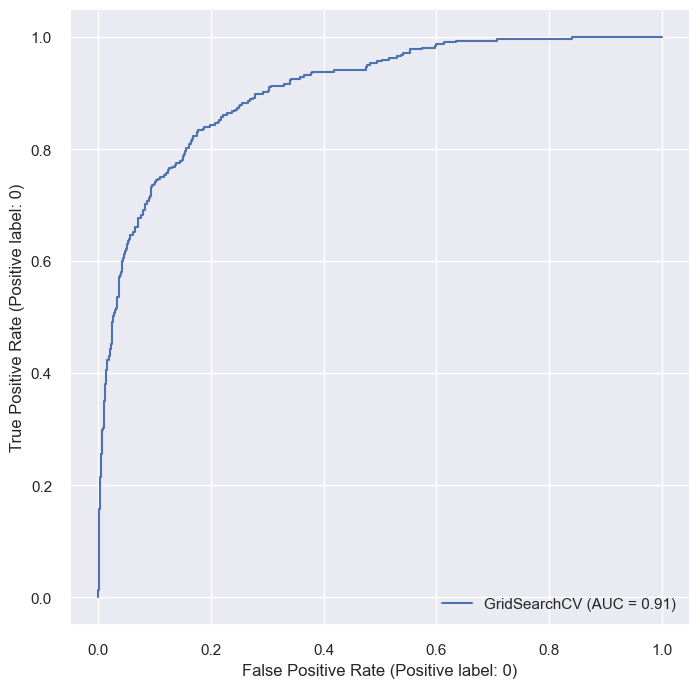

In [285]:
plt.figure(figsize=(8,8));
RocCurveDisplay.from_estimator(lr_gs, X_test_sd,y_test, pos_label=0, ax=plt.subplot());

In [286]:
results_df.sort_values(by=['test acc'], ascending=False)

,test acc,precision score (W),recall score (W),f1 score (W),ROC AUC,True Positives,False Positives,False Negatives,True Negatives
Logistic,0.896,0.888,0.896,0.885,0.906,1658.0,168.0,43.0,157.0
GNB,0.868,0.868,0.868,0.868,0.849,1568.0,134.0,133.0,191.0


                   precision    recall  f1-score   support

Attrited Customer       0.82      0.46      0.59       582
Existing Customer       0.82      0.96      0.88      1444

         accuracy                           0.82      2026
        macro avg       0.82      0.71      0.74      2026
     weighted avg       0.82      0.82      0.80      2026



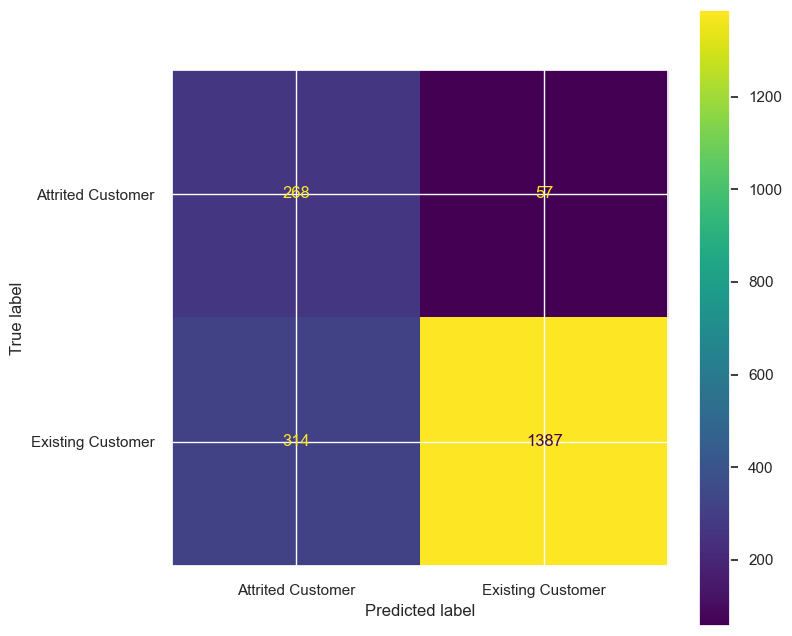

In [287]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
lr= LogisticRegression(class_weight='balanced', max_iter=10000)
param = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': 10**np.linspace(-3, 3, 21, endpoint=True),
    'solver': ['liblinear', 'saga', 'lbfgs']  # Adjust solvers based on penalty choice
}
lrb_gs =  GridSearchCV(lr,param,cv=stratified_kfold, n_jobs=-1, refit=True)
lrb_gs.fit(X_train_sd, y_train);

print(classification_report(lrb_gs.predict(X_test_sd), y_test,target_names=['Attrited Customer', 'Existing Customer']))
results_df = save_results(lrb_gs, X_test_sd, y_test, 'Logistic Balanced', results_df)

plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(lrb_gs, X_test_sd,y_test, display_labels=['Attrited Customer', 'Existing Customer'], ax=plt.subplot());

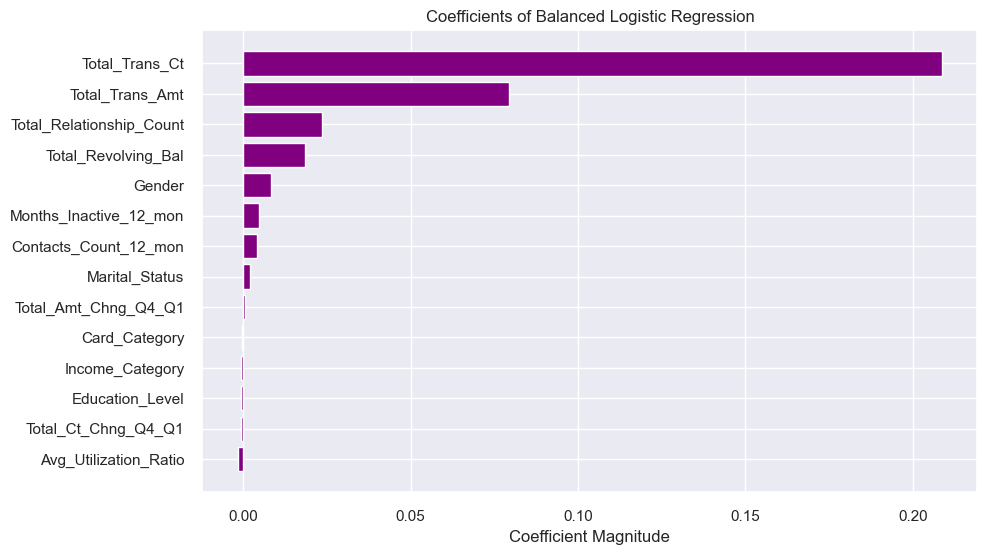

In [185]:
print_importance(lrb_gs, X_test_sd, y_test, 'Balanced Logistic Regression')

## SVM lineales/cuadraticos


In [288]:
from sklearn.svm import SVC
from sklearn.svm import SVR

from yellowbrick.classifier.rocauc import roc_auc


from skopt import BayesSearchCV

np.int = int # fix for skopt
np.float = float # fix for skopt

,params,mean_test_score,rank_test_score
10,{'C': 0.1096478196143185},0.822,1
7,{'C': 1.1481536214968828},0.822,2
9,{'C': 0.16595869074375597},0.822,3
0,{'C': 1.513561248436207},0.821,4
2,{'C': 1.513561248436207},0.821,4


                   precision    recall  f1-score   support

Attrited Customer       0.45      0.84      0.59       325
Existing Customer       0.96      0.80      0.88      1701

         accuracy                           0.81      2026
        macro avg       0.71      0.82      0.73      2026
     weighted avg       0.88      0.81      0.83      2026



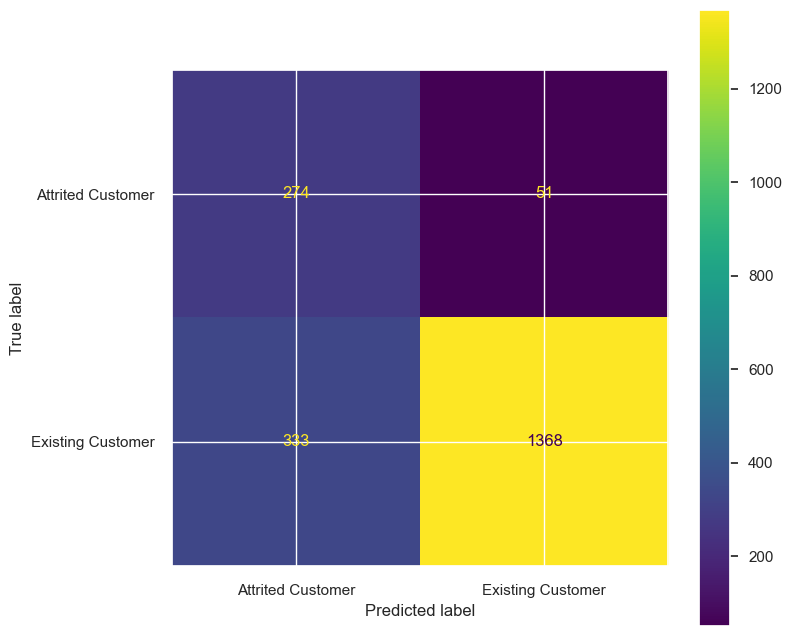

In [289]:
param = {'C':10**np.linspace(-3,3,101)}

lsvc = SVC(kernel='linear',class_weight='balanced', max_iter=25000, random_state=0)
lsvc_gs = BayesSearchCV(lsvc,param,n_iter=niter, cv=stratified_kfold, n_jobs=-1, refit=True, random_state=0)
lsvc_gs.fit(X_train_sd, y_train);

show_html(pd.DataFrame(lsvc_gs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

print(classification_report(y_test, lsvc_gs.predict(X_test_sd), target_names=['Attrited Customer', 'Existing Customer']))
results_df = save_results(lsvc_gs, X_test_sd, y_test, 'linear SVM binary', results_df)

plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(lsvc_gs, X_test_sd, y_test, display_labels=['Attrited Customer', 'Existing Customer'], ax=plt.subplot());

#plt.figure(figsize=(8,8));
#roc_auc(lsvc_gs, X_train_sd, y_train, X_test_sd, y_test, classes=['Attrited Customer', 'Existing Customer']);

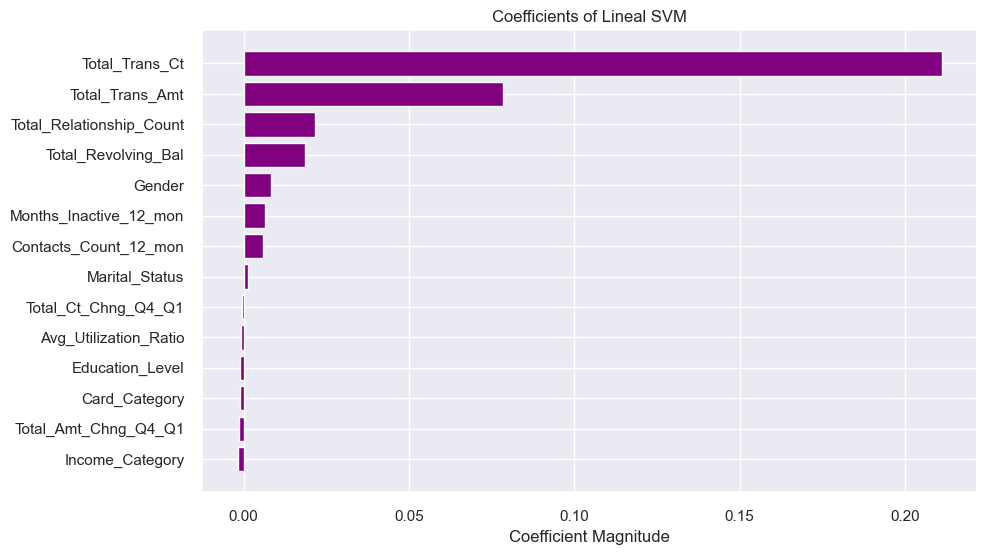

In [188]:
print_importance(lsvc_gs, X_test_sd, y_test, 'Lineal SVM')

,params,mean_test_score,rank_test_score
7,"{'C': 1.1481536214968828, 'degree': 3}",0.893,1
0,"{'C': 1.513561248436207, 'degree': 3}",0.893,2
14,"{'C': 0.25118864315095796, 'degree': 3}",0.891,3
5,"{'C': 109.64781961431851, 'degree': 3}",0.889,4
11,"{'C': 6.025595860743575, 'degree': 3}",0.888,5


                   precision    recall  f1-score   support

Attrited Customer       0.62      0.83      0.71       325
Existing Customer       0.97      0.90      0.93      1701

         accuracy                           0.89      2026
        macro avg       0.79      0.87      0.82      2026
     weighted avg       0.91      0.89      0.90      2026



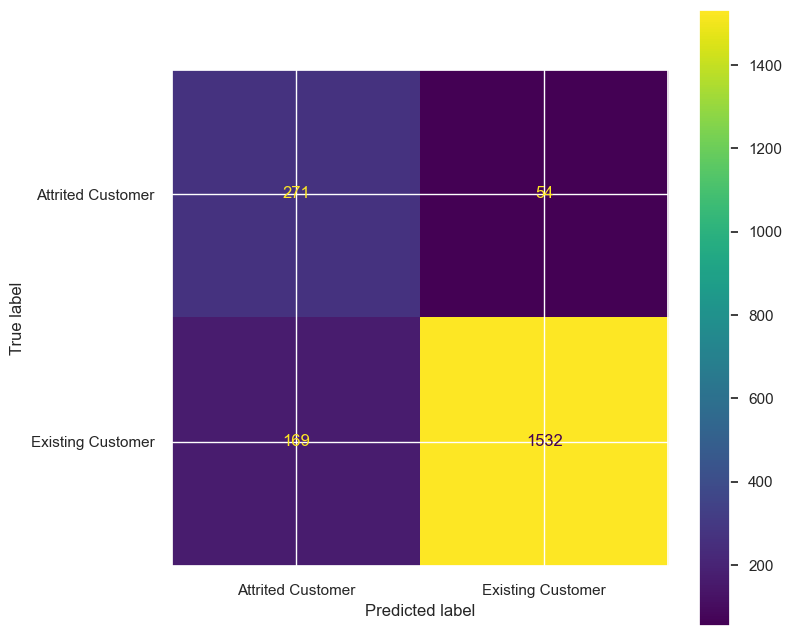

In [290]:
param = {'C':10**np.linspace(-3,3,101), 'degree':[2,3]}

psvc =  SVC(kernel='poly', class_weight='balanced', max_iter=25000, random_state=0)
psvc_gs = BayesSearchCV(psvc,param,n_iter=niter, cv=stratified_kfold, n_jobs=-1, refit=True, random_state=0)
psvc_gs.fit(X_train_sd, y_train);

show_html(pd.DataFrame(psvc_gs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

print(classification_report(y_test, psvc_gs.predict(X_test_sd), target_names=['Attrited Customer', 'Existing Customer']))
results_df = save_results(psvc_gs, X_test_sd, y_test, 'polynomial SVM binary', results_df)

plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(psvc_gs, X_test_sd, y_test, display_labels=['Attrited Customer', 'Existing Customer'], ax=plt.subplot());

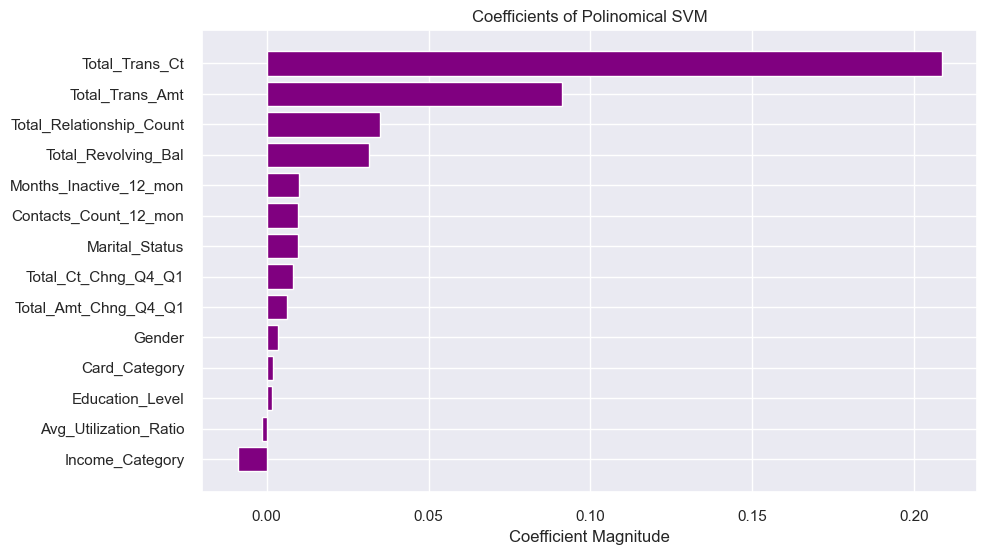

In [190]:
print_importance(psvc_gs, X_test_sd, y_test, 'Polinomical SVM')

# 10. Modelos no Lineales Completos

## SVM no lineal con BRF


,params,mean_test_score,rank_test_score
5,"{'C': 109.64781961431851, 'gamma': 'scale'}",0.902,1
12,"{'C': 6.918309709189362, 'gamma': 'scale'}",0.901,2
13,"{'C': 125.89254117941663, 'gamma': 'auto'}",0.901,3
11,"{'C': 380.1893963205613, 'gamma': 'auto'}",0.897,4
6,"{'C': 660.6934480075951, 'gamma': 'scale'}",0.897,5


                   precision    recall  f1-score   support

Attrited Customer       0.68      0.73      0.71       325
Existing Customer       0.95      0.94      0.94      1701

         accuracy                           0.90      2026
        macro avg       0.82      0.83      0.82      2026
     weighted avg       0.91      0.90      0.90      2026



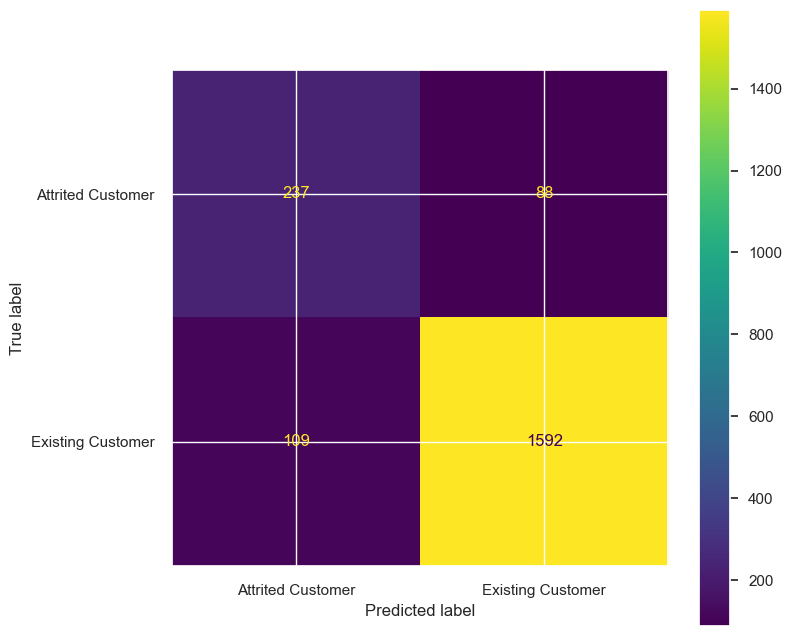

In [291]:
param = {'C':10**np.linspace(-3,3,101), 'gamma':['scale','auto']}

rbsvc =  SVC(kernel='rbf', class_weight='balanced', max_iter=25000, random_state=0)
rbsvc_gs = BayesSearchCV(rbsvc,param,n_iter=niter, cv=stratified_kfold, n_jobs=-1, refit=True, random_state=0)
rbsvc_gs.fit(X_train_sd, y_train);

show_html(pd.DataFrame(rbsvc_gs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

print(classification_report(y_test, rbsvc_gs.predict(X_test_sd), target_names=['Attrited Customer', 'Existing Customer']))
results_df = save_results(rbsvc_gs, X_test_sd, y_test, 'RBF SVM binary', results_df)

plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(rbsvc_gs, X_test_sd, y_test, display_labels=['Attrited Customer', 'Existing Customer'], ax=plt.subplot());

## Arboles de decision


In [292]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, GradientBoostingClassifier,ExtraTreesClassifier
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier.rocauc import roc_auc
from skopt import BayesSearchCV
np.int = int # fix for skopt
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import  RandomOverSampler, SMOTE

,params,mean_test_score,rank_test_score
13,"{'criterion': 'gini', 'max_depth': 9, 'max_leaf_nodes': 30, 'min_samples_leaf': 10, 'splitter': 'best'}",0.940,1
1,"{'criterion': 'entropy', 'max_depth': 9, 'max_leaf_nodes': 30, 'min_samples_leaf': 3, 'splitter': 'best'}",0.936,2
5,"{'criterion': 'gini', 'max_depth': 9, 'max_leaf_nodes': 20, 'min_samples_leaf': 3, 'splitter': 'best'}",0.935,3
12,"{'criterion': 'gini', 'max_depth': 6, 'max_leaf_nodes': 30, 'min_samples_leaf': 1, 'splitter': 'best'}",0.934,4
7,"{'criterion': 'gini', 'max_depth': 5, 'max_leaf_nodes': 20, 'min_samples_leaf': 1, 'splitter': 'best'}",0.929,5


                   precision    recall  f1-score   support

Attrited Customer       0.81      0.82      0.81       325
Existing Customer       0.97      0.96      0.96      1701

         accuracy                           0.94      2026
        macro avg       0.89      0.89      0.89      2026
     weighted avg       0.94      0.94      0.94      2026



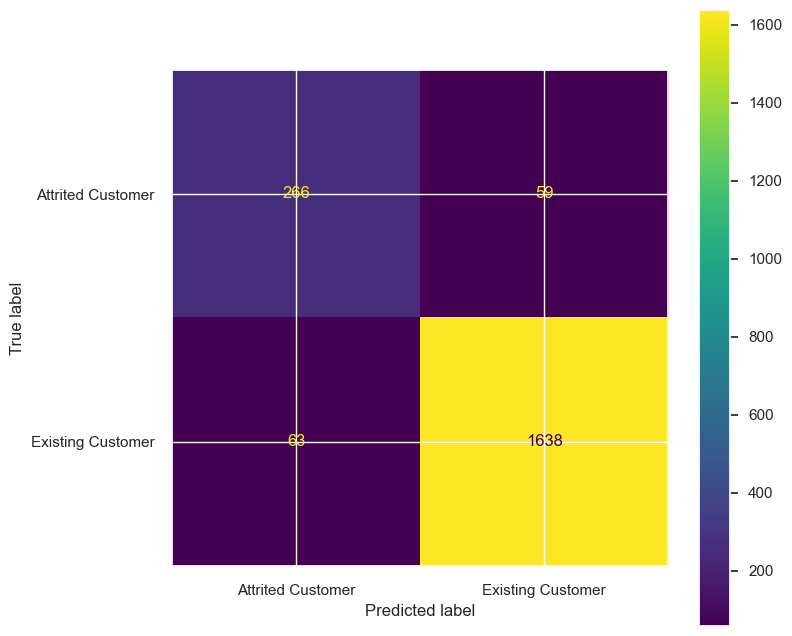

In [293]:
param = {'criterion':['gini', 'entropy'], 
         'max_depth':[None, 2, 3, 4, 5, 6, 7, 8, 9],
         'min_samples_leaf':[1,2,3,5,10], 
         'splitter': ['best', 'random'], 
         'max_leaf_nodes':[5, 10, 20, 30]}

dt =  DecisionTreeClassifier(random_state=0)
dt_bs =  BayesSearchCV(dt,param,n_iter=niter, cv=stratified_kfold, n_jobs=-1, refit=True, random_state=0)
dt_bs.fit(X_train, y_train);

show_html(pd.DataFrame(dt_bs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

print(classification_report(y_test, dt_bs.predict(X_test), target_names=cls))
results_df = save_results(dt_bs, X_test, y_test, 'DTree base', results_df)

plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(dt_bs, X_test,y_test, display_labels=cls, ax=plt.subplot());

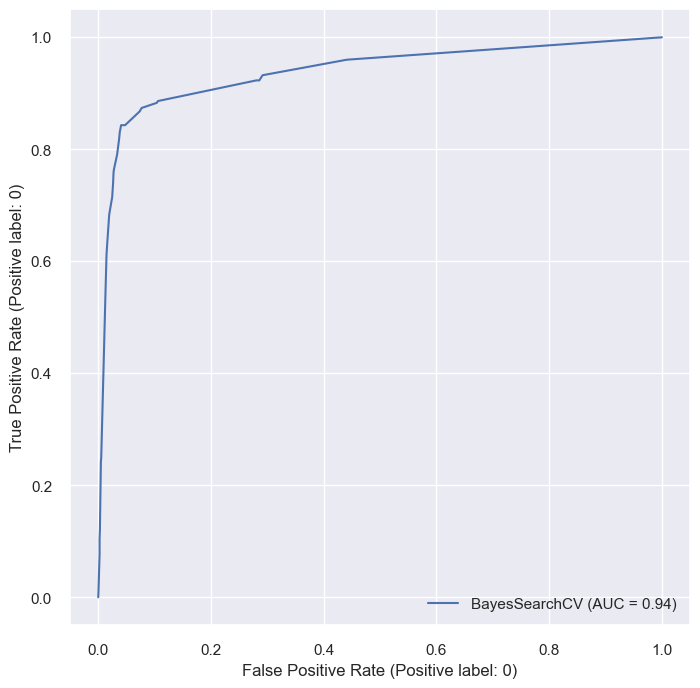

In [294]:
plt.figure(figsize=(8,8));
RocCurveDisplay.from_estimator(dt_bs, X_test,y_test, pos_label=0, ax=plt.subplot());

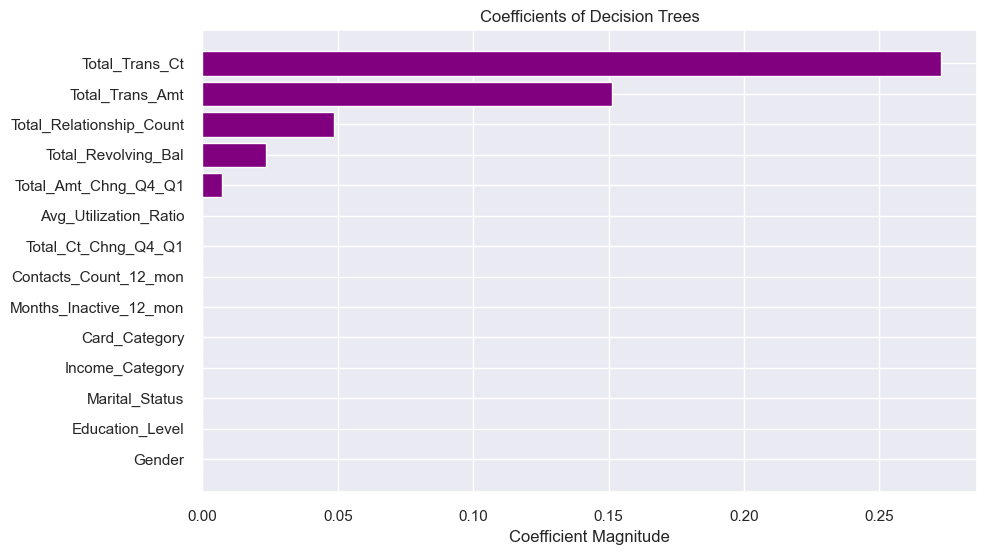

In [222]:
print_importance(dt_bs, X_test, y_test, 'Decision Trees')

In [195]:
import dtreeviz

data_train_num = pd.concat([pd.DataFrame(X_train), y_train], axis=1)

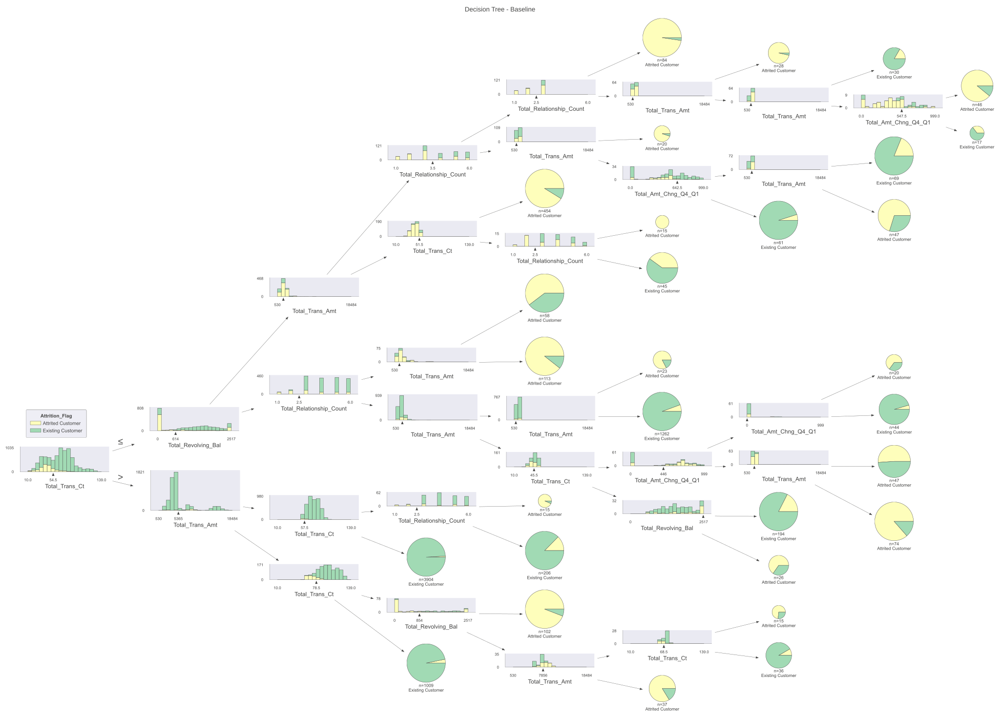

In [196]:
v_model = dtreeviz.model(dt_bs.best_estimator_, 
               X_train=X_train,
               y_train=y_train,
               target_name='Attrition_Flag',
               feature_names=[c for c in data_train_num.columns if c!='Attrition_Flag'],
               class_names=cls
               )
v_model.view(scale=1.5, title="Decision Tree - Baseline",orientation='LR')

### Purbas con diferentes muestros

                   precision    recall  f1-score   support

Attrited Customer       0.81      0.82      0.82       325
Existing Customer       0.97      0.96      0.96      1701

         accuracy                           0.94      2026
        macro avg       0.89      0.89      0.89      2026
     weighted avg       0.94      0.94      0.94      2026



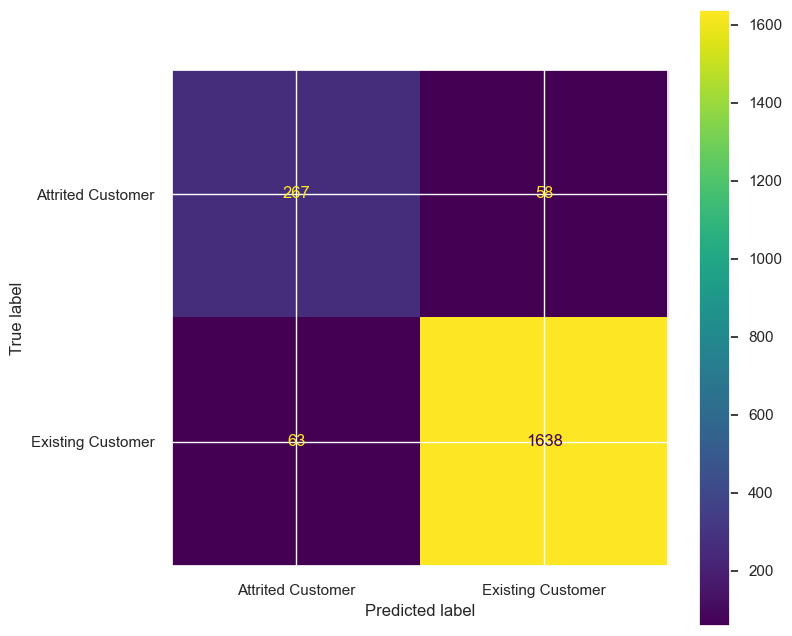

In [295]:
from imblearn.pipeline import make_pipeline, Pipeline
param = {'dt__criterion':['gini', 'entropy'], 
         'dt__max_depth':[None, 2, 3, 4, 5, 6, 7, 8, 9],
         'dt__min_samples_leaf':[1,2,3,5,10], 
         'dt__splitter': ['best', 'random'], 
         'dt__max_leaf_nodes':[5, 10, 20, 30],
         'rus__sampling_strategy':np.linspace(0.2,0.5,16)}

dt =  DecisionTreeClassifier(random_state=0)
rus = RandomUnderSampler(random_state=0)
dt_us= Pipeline([('rus', rus), ('dt', dt)])
dt_us_bs =  BayesSearchCV(dt_us,param,n_iter=niter, cv=stratified_kfold, n_jobs=-1, refit=True, random_state=0)
dt_us_bs.fit(X_train, y_train);

#show_html(pd.DataFrame(dt_us_bs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

print(classification_report(y_test, dt_us_bs.predict(X_test), target_names=cls))
results_df = save_results(dt_us_bs, X_test, y_test, 'DTree under samp', results_df)

plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(dt_us_bs, X_test,y_test, display_labels=cls, ax=plt.subplot());

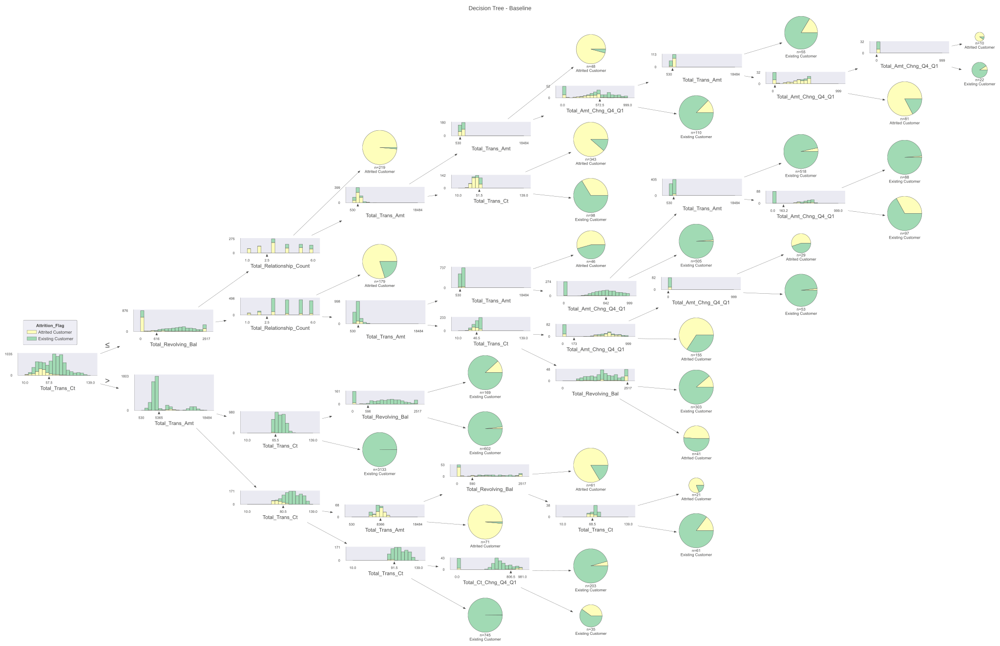

In [198]:
v_model = dtreeviz.model(dt_us_bs.best_estimator_['dt'], 
               X_train=X_train,
               y_train=y_train,
               target_name='Attrition_Flag',
               feature_names=[c for c in data_train_num.columns if c!='Attrition_Flag'],
               class_names=cls
               )
v_model.view(scale=1.5, title="Decision Tree - Baseline",orientation='LR')

                   precision    recall  f1-score   support

Attrited Customer       0.78      0.85      0.81       325
Existing Customer       0.97      0.95      0.96      1701

         accuracy                           0.94      2026
        macro avg       0.87      0.90      0.89      2026
     weighted avg       0.94      0.94      0.94      2026



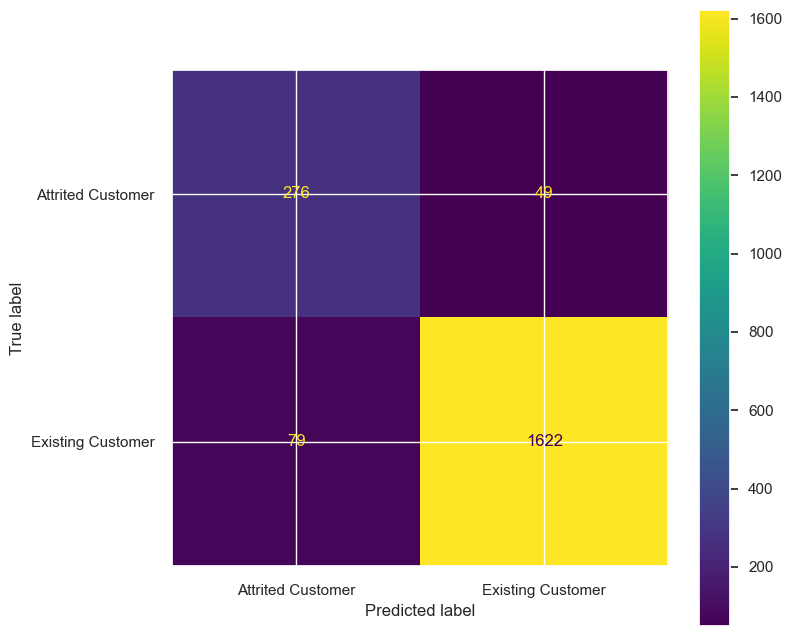

In [296]:
param = {'dt__criterion':['gini', 'entropy'], 
         'dt__max_depth':[None, 2, 3, 4, 5, 6, 7, 8, 9],
         'dt__min_samples_leaf':[1,2,3,5,10], 
         'dt__splitter': ['best', 'random'], 
         'dt__max_leaf_nodes':[5, 10, 20, 30],
         'ros__sampling_strategy':np.linspace(0.2,0.5,16)}

dt =  DecisionTreeClassifier(random_state=0)
ros = RandomOverSampler(random_state=0)
dt_os= Pipeline([('ros', ros), ('dt', dt)])
dt_os_bs =  BayesSearchCV(dt_os,param,n_iter=niter, cv=stratified_kfold, n_jobs=-1, refit=True, random_state=0)
dt_os_bs.fit(X_train, y_train);

#show_html(pd.DataFrame(dt_os_bs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())
print(classification_report(y_test, dt_os_bs.predict(X_test), target_names=cls))
results_df = save_results(dt_os_bs, X_test, y_test, 'DTree over samp', results_df)
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(dt_os_bs, X_test,y_test, display_labels=cls, ax=plt.subplot());

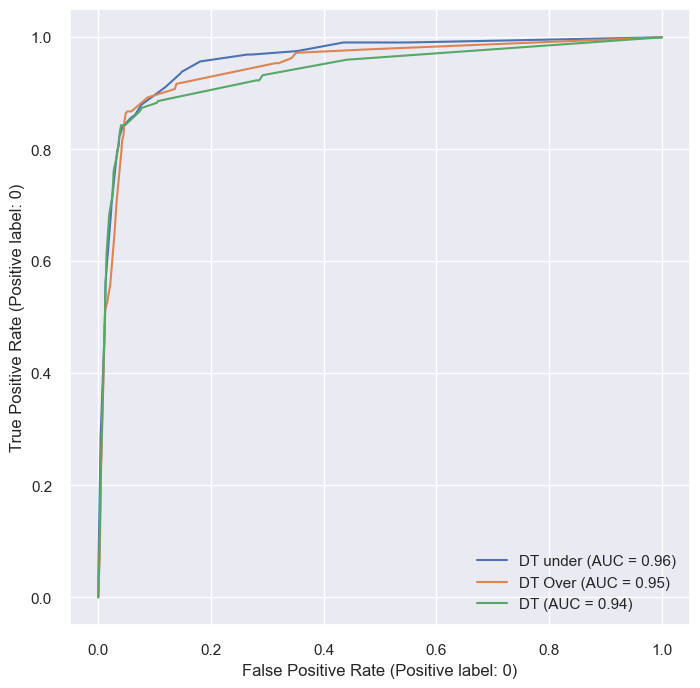

In [297]:
plt.figure(figsize=(8,8));
RocCurveDisplay.from_estimator(dt_us_bs, X_test,y_test, pos_label=0, ax=plt.subplot(), name="DT under");
RocCurveDisplay.from_estimator(dt_os_bs, X_test,y_test, pos_label=0, ax=plt.subplot(), name="DT Over");
RocCurveDisplay.from_estimator(dt_bs, X_test,y_test, pos_label=0, ax=plt.subplot(), name="DT");

## Gradient Boosting

BayesSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
              estimator=GradientBoostingClassifier(n_iter_no_change=5,
                                                   random_state=0),
              n_iter=15, n_jobs=-1, random_state=0,
              search_spaces={'criterion': ['friedman_mse', 'squared_error'],
                             'learning_rate': [0.1, 0.5, 1, 3, 5, 10, 15],
                             'loss': ['log_loss', 'exponential'],
                             'max_depth': [None, 1, 2, 3, 5, 8, 9, 10, 15],
                             'min_samples_leaf': [1, 2, 3, 5, 10],
                             'n_estimators': [5, 10, 25, 40, 50, 75, 100, 200]})

                   precision    recall  f1-score   support

Attrited Customer       0.89      0.81      0.85       325
Existing Customer       0.96      0.98      0.97      1701

         accuracy                           0.95      2026
        macro avg       0.93      0.89      0.91      2026
     weighted avg       0.95      0.95      0.95      2026



<Figure size 800x800 with 0 Axes>

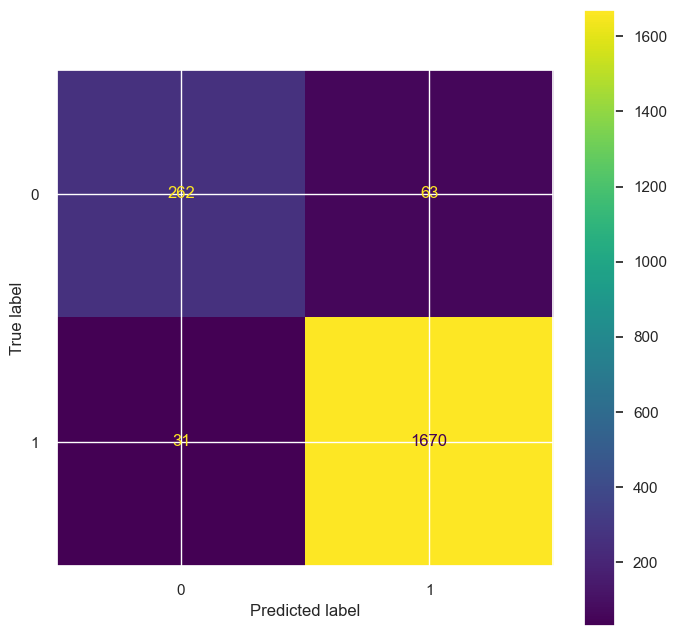

In [298]:
param = {'n_estimators': [5,10,25,40, 50, 75,100, 200], 
         'loss':['log_loss', 'exponential'], 
         'criterion':['friedman_mse', 'squared_error'], 
         'max_depth':[None, 1, 2, 3,  5,  8, 9,10,15],
         'min_samples_leaf':[1,2,3,5,10], 
         'learning_rate':[0.1,0.5, 1,3, 5, 10, 15]}

gb =  GradientBoostingClassifier(random_state=0,n_iter_no_change=5)
gb_bs =  BayesSearchCV(gb,param,n_iter=niter, cv=stratified_kfold, n_jobs=-1, refit=True, random_state=0)
gb_bs.fit(X_train, y_train);

print(classification_report(y_test, gb_bs.predict(X_test), target_names=cls))
results_df = save_results(gb_bs, X_test, y_test, 'Gradient Boosting', results_df)

plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(gb_bs, X_test,y_test, ax=plt.subplot())

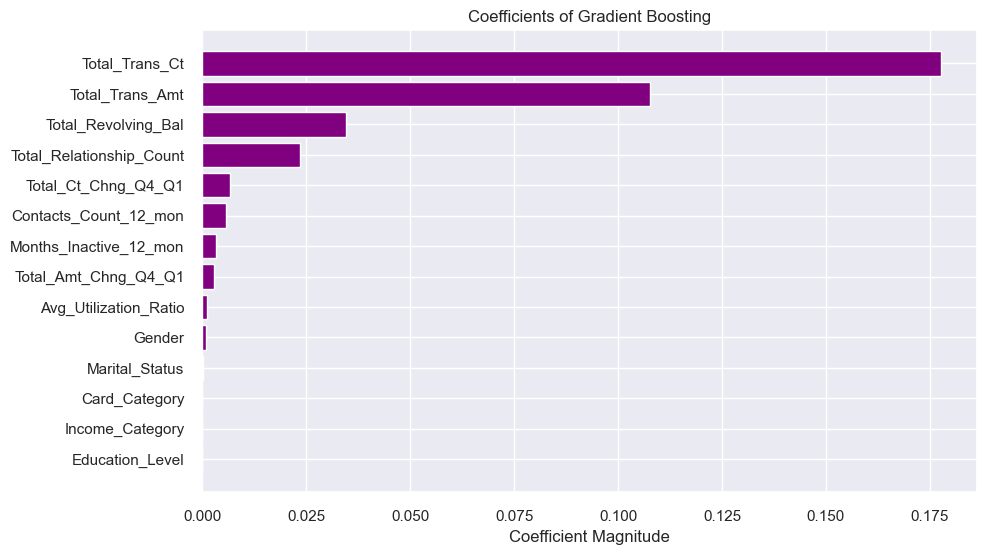

In [299]:
print_importance(gb_bs, X_test, y_test, 'Gradient Boosting')

BayesSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
              estimator=Pipeline(steps=[('rus',
                                         RandomUnderSampler(random_state=0)),
                                        ('gb',
                                         GradientBoostingClassifier(n_iter_no_change=5,
                                                                    random_state=0))]),
              n_iter=15, n_jobs=-1, random_state=0,
              search_spaces={'gb__criterion': ['friedman_mse', 'squared_error'],
                             'gb__learning_rate': [0.1, 0.5, 1, 3, 5, 10, 15],
                             'gb__loss': ['log_loss', 'exponential'],
                             'gb__max_depth': [None, 1, 2, 3, 5, 8, 9, 10, 15],
                             'gb__min_samples_leaf': [1, 2, 3, 5, 10],
                             'gb__n_estimators': [5, 10, 25, 40, 50, 75, 100,
                                                  200],
       

                   precision    recall  f1-score   support

Attrited Customer       0.89      0.89      0.89       325
Existing Customer       0.98      0.98      0.98      1701

         accuracy                           0.96      2026
        macro avg       0.93      0.93      0.93      2026
     weighted avg       0.96      0.96      0.96      2026



<Figure size 800x800 with 0 Axes>

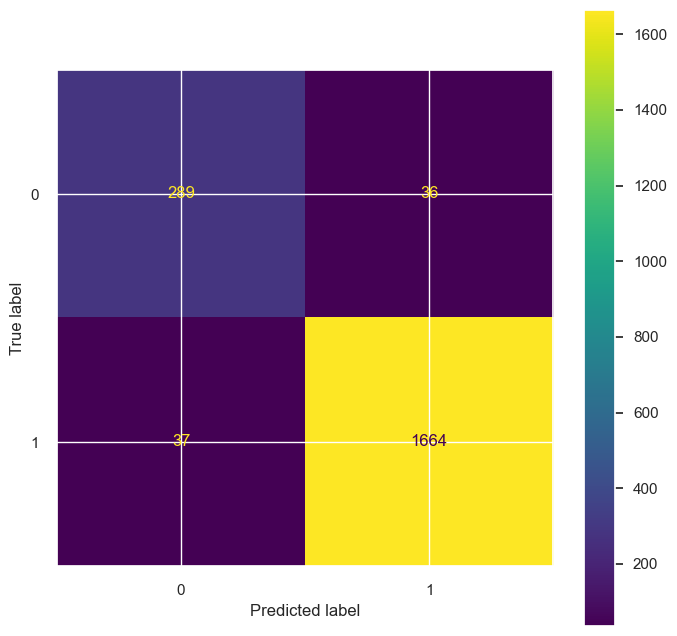

In [300]:
param = {
    'gb__n_estimators': [5, 10, 25, 40, 50, 75, 100, 200],
    'gb__loss': ['log_loss', 'exponential'],
    'gb__criterion': ['friedman_mse', 'squared_error'],
    'gb__max_depth': [None, 1, 2, 3, 5, 8, 9, 10, 15],
    'gb__min_samples_leaf': [1, 2, 3, 5, 10],
    'gb__learning_rate': [0.1, 0.5, 1, 3, 5, 10, 15],
    'rus__sampling_strategy':np.linspace(0.2,0.5,16)}

gb =  GradientBoostingClassifier(random_state=0,n_iter_no_change=5)
rus = RandomUnderSampler(random_state=0)
gb1= Pipeline([('rus', rus), ('gb', gb)])
gb_bs1 =  BayesSearchCV(gb1,param,n_iter=niter, cv=stratified_kfold, n_jobs=-1, refit=True, random_state=0)
gb_bs1.fit(X_train, y_train);

print(classification_report(y_test, gb_bs1.predict(X_test), target_names=cls))
results_df = save_results(gb_bs1, X_test, y_test, 'Gradient Boosting_Undersampled', results_df)

plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(gb_bs1, X_test,y_test, ax=plt.subplot())



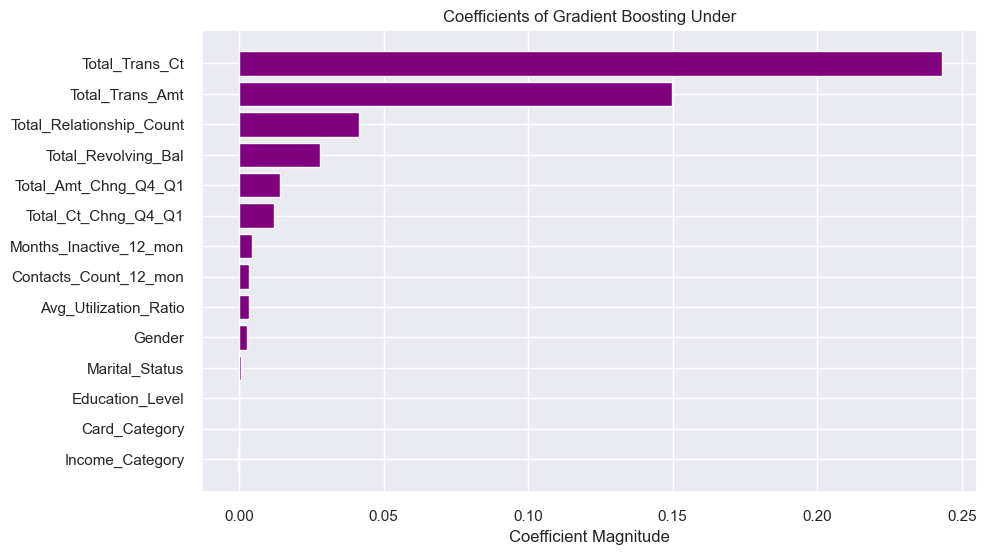

In [301]:
print_importance(gb_bs1, X_test, y_test, 'Gradient Boosting Under')

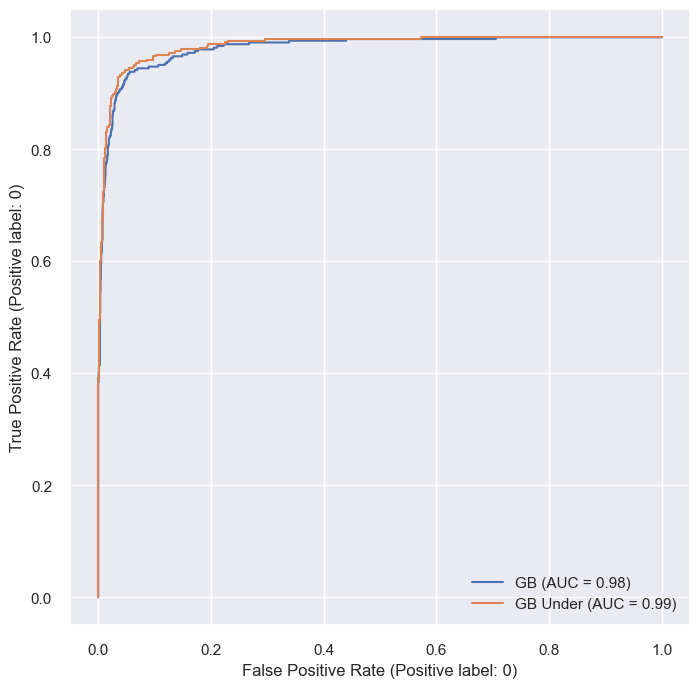

In [302]:
plt.figure(figsize=(8,8));
RocCurveDisplay.from_estimator(gb_bs, X_test,y_test, pos_label=0, ax=plt.subplot(), name="GB");
RocCurveDisplay.from_estimator(gb_bs1, X_test,y_test, pos_label=0, ax=plt.subplot(), name="GB Under");

## Random Forest

In [303]:
param = {'n_estimators': [5,10,25,40, 50, 75,100, 200], 
         'criterion':['gini', 'entropy'], 
         'max_depth':[None, 1, 2, 3,  5,  8, 9,10,15],
         'min_samples_leaf':[1,2,3,5,10]}

rf =  RandomForestClassifier(random_state=0)
rf_bs =  BayesSearchCV(rf,param,n_iter=niter, cv=stratified_kfold, n_jobs=-1, refit=True, random_state=0)
rf_bs.fit(X_train, y_train);

show_html(pd.DataFrame(rf_bs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

BayesSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
              estimator=RandomForestClassifier(random_state=0), n_iter=15,
              n_jobs=-1, random_state=0,
              search_spaces={'criterion': ['gini', 'entropy'],
                             'max_depth': [None, 1, 2, 3, 5, 8, 9, 10, 15],
                             'min_samples_leaf': [1, 2, 3, 5, 10],
                             'n_estimators': [5, 10, 25, 40, 50, 75, 100, 200]})

,params,mean_test_score,rank_test_score
13,"{'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 5, 'n_estimators': 50}",0.947,1
5,"{'criterion': 'gini', 'max_depth': 15, 'min_samples_leaf': 5, 'n_estimators': 40}",0.946,2
12,"{'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 5, 'n_estimators': 50}",0.946,3
2,"{'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 2, 'n_estimators': 10}",0.944,4
3,"{'criterion': 'entropy', 'max_depth': 9, 'min_samples_leaf': 3, 'n_estimators': 40}",0.943,5


                   precision    recall  f1-score   support

Attrited Customer       0.90      0.76      0.83       325
Existing Customer       0.96      0.98      0.97      1701

         accuracy                           0.95      2026
        macro avg       0.93      0.87      0.90      2026
     weighted avg       0.95      0.95      0.95      2026



<Figure size 800x800 with 0 Axes>

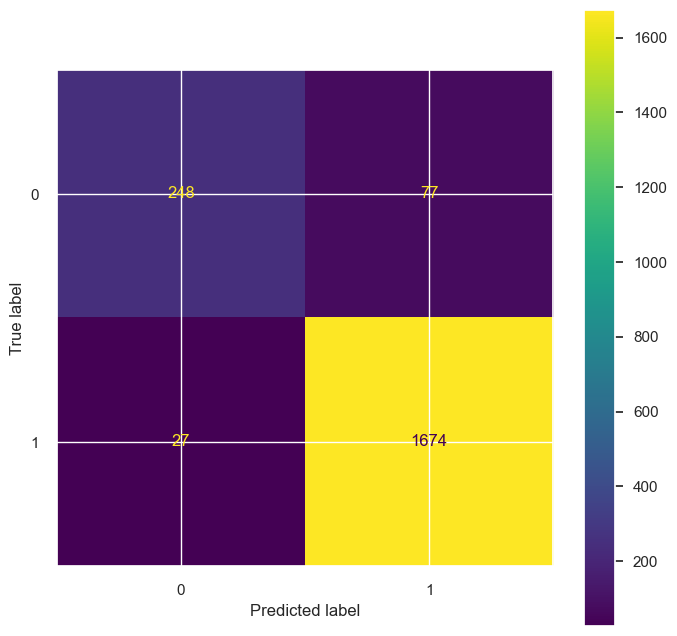

In [304]:
print(classification_report(y_test, rf_bs.predict(X_test), target_names=cls))
results_df = save_results(rf_bs, X_test, y_test, 'Random Forest', results_df)

plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(rf_bs, X_test,y_test, ax=plt.subplot())

BayesSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
              estimator=Pipeline(steps=[('rus',
                                         RandomUnderSampler(random_state=0)),
                                        ('rf',
                                         RandomForestClassifier(random_state=0))]),
              n_iter=15, n_jobs=-1, random_state=0,
              search_spaces={'rf__criterion': ['gini', 'entropy'],
                             'rf__max_depth': [None, 1, 2, 3, 5, 8, 9, 10, 15],
                             'rf__min_samples_leaf': [1, 2, 3, 5, 10],
                             'rf__n_estimators': [5, 10, 25, 40, 50, 75, 100,
                                                  200],
                             'rus__sampling_strategy': array([0.2 , 0.22, 0.24, 0.26, 0.28, 0.3 , 0.32, 0.34, 0.36, 0.38, 0.4 ,
       0.42, 0.44, 0.46, 0.48, 0.5 ])})

,params,mean_test_score,rank_test_score
5,"{'rf__criterion': 'gini', 'rf__max_depth': 15, 'rf__min_samples_leaf': 5, 'rf__n_estimators': 40, 'rus__sampling_strategy': 0.30000000000000004}",0.942,1
2,"{'rf__criterion': 'gini', 'rf__max_depth': None, 'rf__min_samples_leaf': 2, 'rf__n_estimators': 10, 'rus__sampling_strategy': 0.28}",0.941,2
8,"{'rf__criterion': 'entropy', 'rf__max_depth': 10, 'rf__min_samples_leaf': 5, 'rf__n_estimators': 200, 'rus__sampling_strategy': 0.34}",0.941,3
6,"{'rf__criterion': 'gini', 'rf__max_depth': 9, 'rf__min_samples_leaf': 3, 'rf__n_estimators': 10, 'rus__sampling_strategy': 0.28}",0.941,4
3,"{'rf__criterion': 'entropy', 'rf__max_depth': 9, 'rf__min_samples_leaf': 3, 'rf__n_estimators': 40, 'rus__sampling_strategy': 0.44}",0.938,5


                   precision    recall  f1-score   support

Attrited Customer       0.84      0.83      0.84       325
Existing Customer       0.97      0.97      0.97      1701

         accuracy                           0.95      2026
        macro avg       0.91      0.90      0.90      2026
     weighted avg       0.95      0.95      0.95      2026



<Figure size 800x800 with 0 Axes>

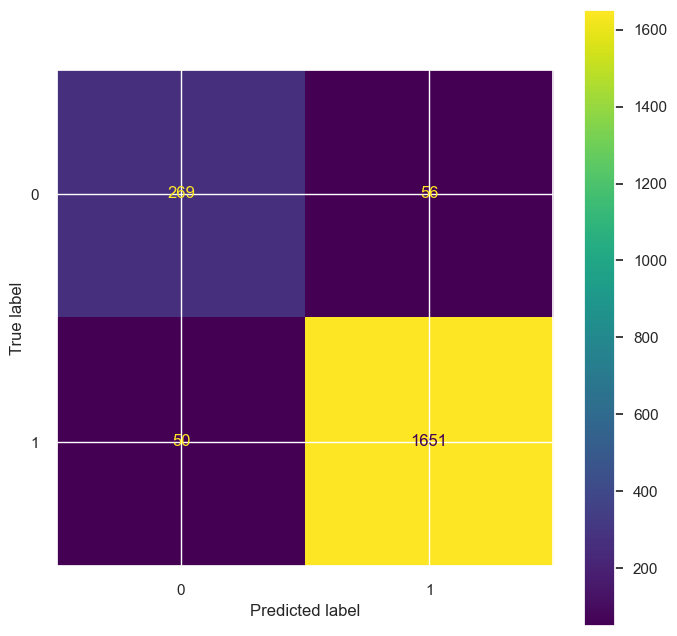

In [305]:
param = {'rf__n_estimators': [5,10,25,40, 50, 75,100, 200], 
         'rf__criterion':['gini', 'entropy'], 
         'rf__max_depth':[None, 1, 2, 3,  5,  8, 9,10,15],
         'rf__min_samples_leaf':[1,2,3,5,10],
         'rus__sampling_strategy':np.linspace(0.2,0.5,16)}

rf =  RandomForestClassifier(random_state=0)
rus = RandomUnderSampler(random_state=0)
rf1= Pipeline([('rus', rus), ('rf', rf)])
rf_bs1 =  BayesSearchCV(rf1,param,n_iter=niter, cv=stratified_kfold, n_jobs=-1, refit=True, random_state=0)
rf_bs1.fit(X_train, y_train);

show_html(pd.DataFrame(rf_bs1.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

print(classification_report(y_test, rf_bs1.predict(X_test), target_names=cls))
results_df = save_results(rf_bs1, X_test, y_test, 'Random Forest Undersampled', results_df)

plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(rf_bs1, X_test,y_test, ax=plt.subplot())

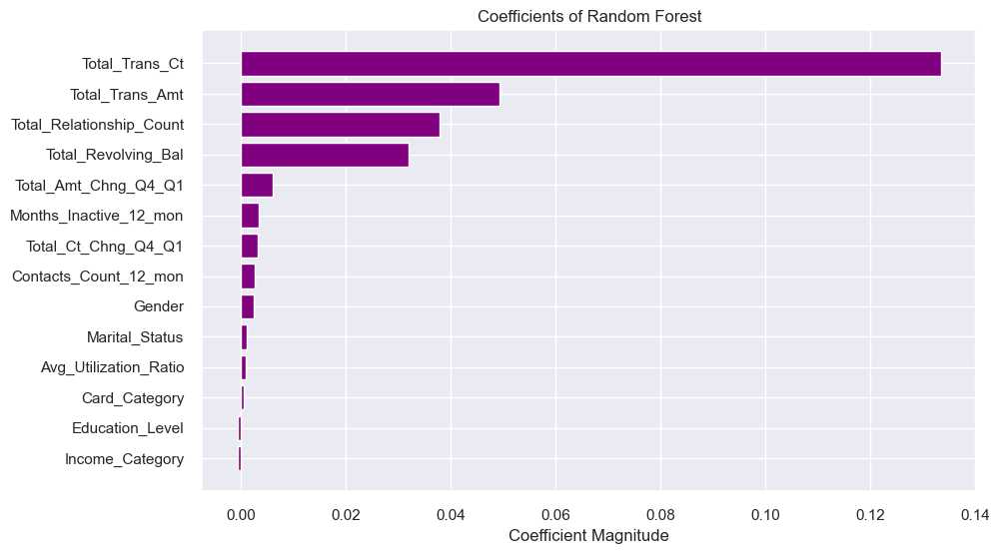

In [306]:
print_importance(rf_bs, X_test, y_test, 'Random Forest')

## Weighted Random Forest

BayesSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
              estimator=RandomForestClassifier(class_weight={0: 5.5, 1: 1},
                                               random_state=0),
              n_iter=15, n_jobs=-1, random_state=0,
              search_spaces={'criterion': ['gini', 'entropy'],
                             'max_depth': [None, 1, 2, 3, 5, 8, 9, 10, 15],
                             'min_samples_leaf': [1, 2, 3, 5, 10],
                             'n_estimators': [5, 10, 25, 40, 50, 75, 100, 200]})

,params,mean_test_score,rank_test_score
10,"{'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 3, 'n_estimators': 40}",0.945,1
13,"{'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 2, 'n_estimators': 10}",0.944,2
2,"{'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 2, 'n_estimators': 10}",0.941,3
5,"{'criterion': 'gini', 'max_depth': 15, 'min_samples_leaf': 5, 'n_estimators': 40}",0.938,4
11,"{'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 2, 'n_estimators': 200}",0.937,5


                   precision    recall  f1-score   support

Attrited Customer       0.86      0.85      0.85       325
Existing Customer       0.97      0.97      0.97      1701

         accuracy                           0.95      2026
        macro avg       0.91      0.91      0.91      2026
     weighted avg       0.95      0.95      0.95      2026



<Figure size 800x800 with 0 Axes>

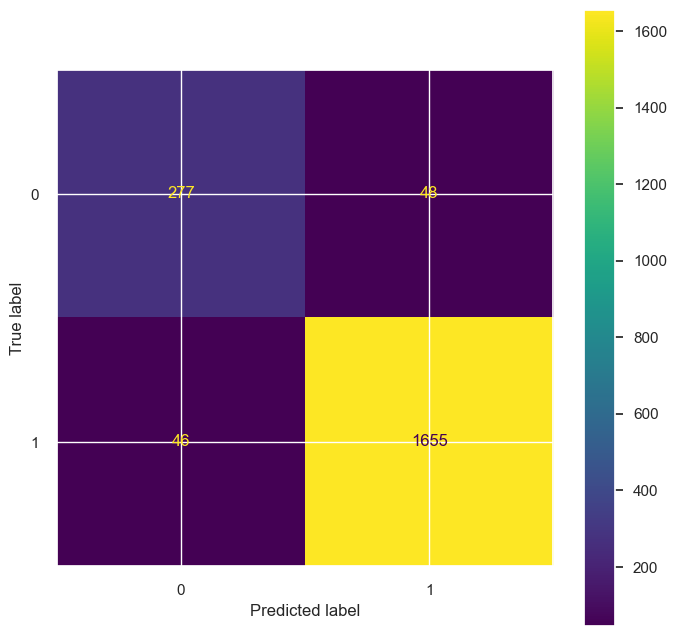

In [307]:
param = {'n_estimators': [5,10,25,40, 50, 75,100, 200], 
         'criterion':['gini', 'entropy'], 
         'max_depth':[None, 1, 2, 3,  5,  8, 9,10,15],
         'min_samples_leaf':[1,2,3,5,10]}

rf =  RandomForestClassifier(random_state=0, class_weight={0:5.5,1:1})
rf_cw_bs =  BayesSearchCV(rf,param,n_iter=niter, cv=stratified_kfold, n_jobs=-1, refit=True, random_state=0)
rf_cw_bs.fit(X_train, y_train);

show_html(pd.DataFrame(rf_cw_bs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

print(classification_report(y_test, rf_cw_bs.predict(X_test), target_names=cls))
results_df = save_results(rf_cw_bs, X_test, y_test, 'Random Forest CW', results_df)

plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(rf_cw_bs, X_test,y_test, ax=plt.subplot())

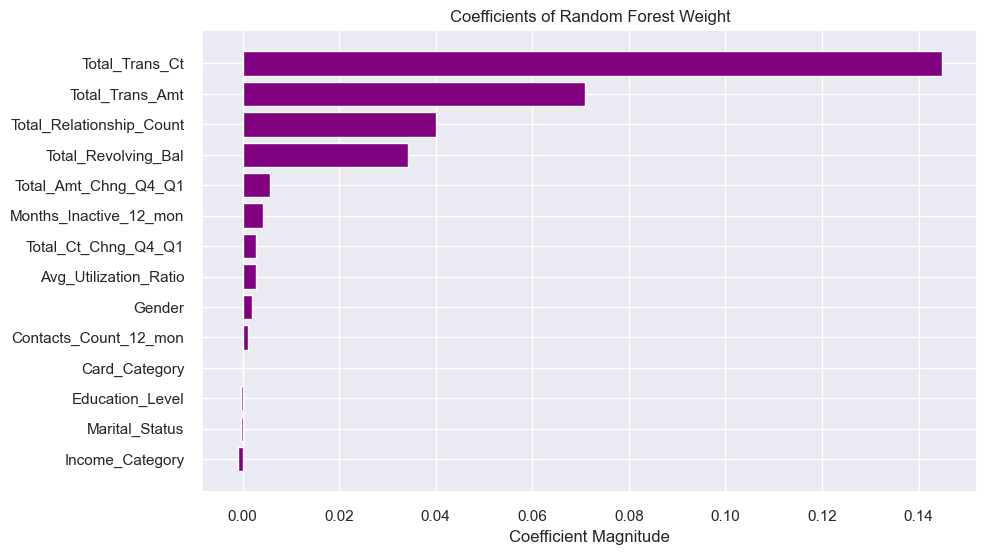

In [308]:
print_importance(rf_cw_bs, X_test, y_test, 'Random Forest Weight')

## Comparación final

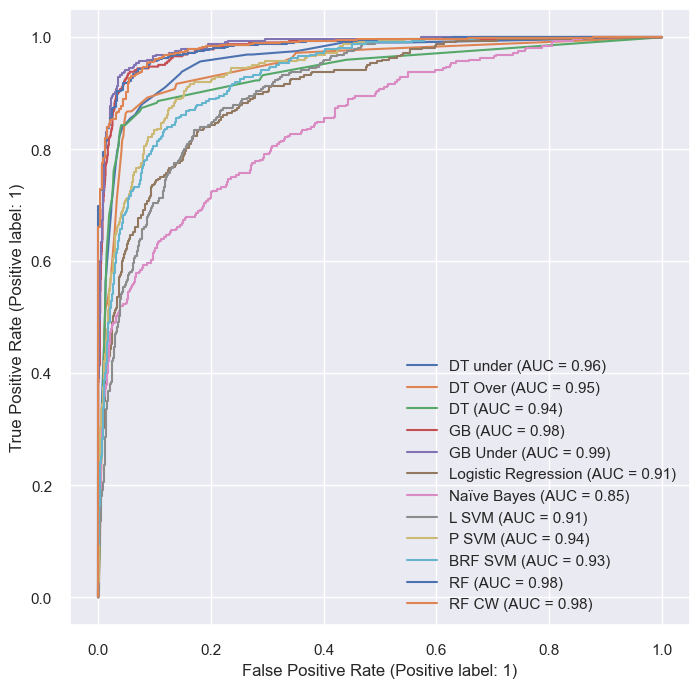

In [309]:
plt.figure(figsize=(8,8));
RocCurveDisplay.from_estimator(dt_us_bs, X_test,y_test, pos_label=0, ax=plt.subplot(), name="DT under");
RocCurveDisplay.from_estimator(dt_os_bs, X_test,y_test, pos_label=0, ax=plt.subplot(), name="DT Over");
RocCurveDisplay.from_estimator(dt_bs, X_test,y_test, pos_label=0, ax=plt.subplot(), name="DT");
RocCurveDisplay.from_estimator(gb_bs, X_test,y_test, pos_label=0, ax=plt.subplot(), name="GB");
RocCurveDisplay.from_estimator(gb_bs1, X_test,y_test, pos_label=0, ax=plt.subplot(), name="GB Under");
RocCurveDisplay.from_estimator(lr_gs, X_test_sd,y_test, pos_label=0, ax=plt.subplot(), name="Logistic Regression");
RocCurveDisplay.from_estimator(gnb_model, X_test_sd,y_test, pos_label=0, ax=plt.subplot(),name="Naïve Bayes");
RocCurveDisplay.from_estimator(lsvc_gs, X_test_sd,y_test, pos_label=0, ax=plt.subplot(), name="L SVM");
RocCurveDisplay.from_estimator(psvc_gs, X_test_sd,y_test, pos_label=0, ax=plt.subplot(),name="P SVM");
RocCurveDisplay.from_estimator(rbsvc_gs, X_test_sd,y_test, pos_label=0, ax=plt.subplot(),name="BRF SVM");
RocCurveDisplay.from_estimator(rf_bs, X_test,y_test, pos_label=1, ax=plt.subplot(), name="RF");
RocCurveDisplay.from_estimator(rf_cw_bs, X_test,y_test, pos_label=1, ax=plt.subplot(), name="RF CW");

In [310]:
results_df.sort_values(by=['test acc'], ascending=False)

,test acc,precision score (W),recall score (W),f1 score (W),ROC AUC,True Positives,False Positives,False Negatives,True Negatives
Gradient Boosting_Undersampled,0.964,0.964,0.964,0.964,0.985,1664.0,36.0,37.0,289.0
Gradient Boosting,0.954,0.953,0.954,0.953,0.981,1670.0,63.0,31.0,262.0
Random Forest CW,0.954,0.953,0.954,0.954,0.983,1655.0,48.0,46.0,277.0
Random Forest,0.949,0.947,0.949,0.947,0.983,1674.0,77.0,27.0,248.0
Random Forest Undersampled,0.948,0.947,0.948,0.947,0.981,1651.0,56.0,50.0,269.0
DTree under samp,0.940,0.941,0.940,0.940,0.960,1638.0,58.0,63.0,267.0
DTree base,0.940,0.940,0.940,0.940,0.938,1638.0,59.0,63.0,266.0
DTree over samp,0.937,0.940,0.937,0.938,0.948,1622.0,49.0,79.0,276.0
RBF SVM binary,0.903,0.905,0.903,0.904,NaN,1592.0,88.0,109.0,237.0
Logistic,0.896,0.888,0.896,0.885,0.906,1658.0,168.0,43.0,157.0


In [311]:
results_df.sort_values(by=['True Negatives'], ascending=False)

,test acc,precision score (W),recall score (W),f1 score (W),ROC AUC,True Positives,False Positives,False Negatives,True Negatives
Gradient Boosting_Undersampled,0.964,0.964,0.964,0.964,0.985,1664.0,36.0,37.0,289.0
Random Forest CW,0.954,0.953,0.954,0.954,0.983,1655.0,48.0,46.0,277.0
DTree over samp,0.937,0.940,0.937,0.938,0.948,1622.0,49.0,79.0,276.0
linear SVM binary,0.810,0.882,0.810,0.831,NaN,1368.0,51.0,333.0,274.0
polynomial SVM binary,0.890,0.910,0.890,0.896,NaN,1532.0,54.0,169.0,271.0
Random Forest Undersampled,0.948,0.947,0.948,0.947,0.981,1651.0,56.0,50.0,269.0
Logistic Balanced,0.817,0.880,0.817,0.835,0.909,1387.0,57.0,314.0,268.0
DTree under samp,0.940,0.941,0.940,0.940,0.960,1638.0,58.0,63.0,267.0
DTree base,0.940,0.940,0.940,0.940,0.938,1638.0,59.0,63.0,266.0
Gradient Boosting,0.954,0.953,0.954,0.953,0.981,1670.0,63.0,31.0,262.0


# Ensamble final

Como podemos esperar el ensamble final contendra varios modelos de los que mejor nos han funcionado para ver como se defienden estos juntos y si mejoran en absoluto.

In [312]:
from sklearn.ensemble import StackingClassifier, VotingClassifier
st1 = StackingClassifier([('gb', gb_bs1.best_estimator_),
                          ('rf cw', rf_cw_bs.best_estimator_)],
                          cv=stratified_kfold, n_jobs=1)
st1.best_score_ = np.mean(cross_val_score(st1,X_train,y_train,cv=stratified_kfold))
print(st1.best_score_)                             
st1.fit(X_train, y_train);                

0.9576586621579425


In [313]:
print(classification_report(y_test, st1.predict(X_test), target_names=cls))
results_df = save_results(st1, X_test, y_test, 'Stacking GB1+RF CW', results_df)

                   precision    recall  f1-score   support

Attrited Customer       0.90      0.88      0.89       325
Existing Customer       0.98      0.98      0.98      1701

         accuracy                           0.96      2026
        macro avg       0.94      0.93      0.93      2026
     weighted avg       0.96      0.96      0.96      2026



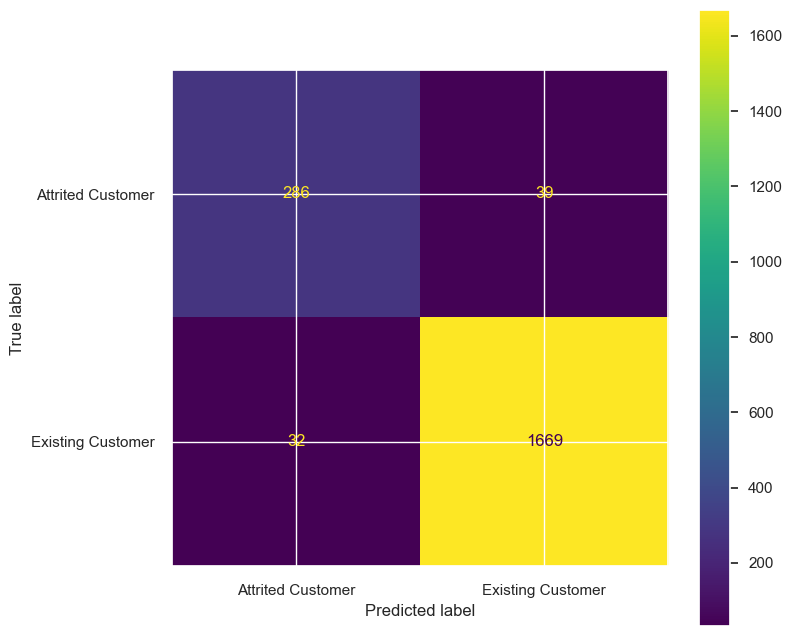

In [314]:
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(st1, X_test,y_test, display_labels=cls, ax=plt.subplot());

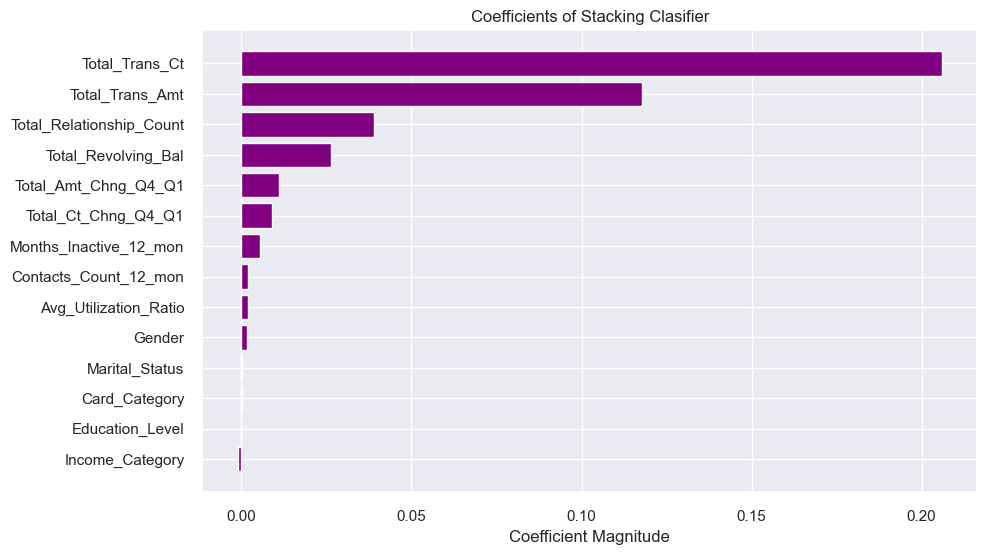

In [315]:
print_importance(st1, X_test, y_test, 'Stacking Clasifier')

In [316]:
vs1 = VotingClassifier([('gb', gb_bs1.best_estimator_),
                          ('rf cw', rf_cw_bs.best_estimator_)],voting='soft', n_jobs=1)
vs1.best_score_ = np.mean(cross_val_score(vs1,X_train,y_train,cv=stratified_kfold))
print(vs1.best_score_)                             
vs1.fit(X_train, y_train); 

0.95741190089946


In [317]:
print(classification_report(y_test, vs1.predict(X_test), target_names=cls))
results_df = save_results(vs1, X_test, y_test, 'Voting GB1+RF CW', results_df)

                   precision    recall  f1-score   support

Attrited Customer       0.89      0.90      0.89       325
Existing Customer       0.98      0.98      0.98      1701

         accuracy                           0.97      2026
        macro avg       0.94      0.94      0.94      2026
     weighted avg       0.97      0.97      0.97      2026



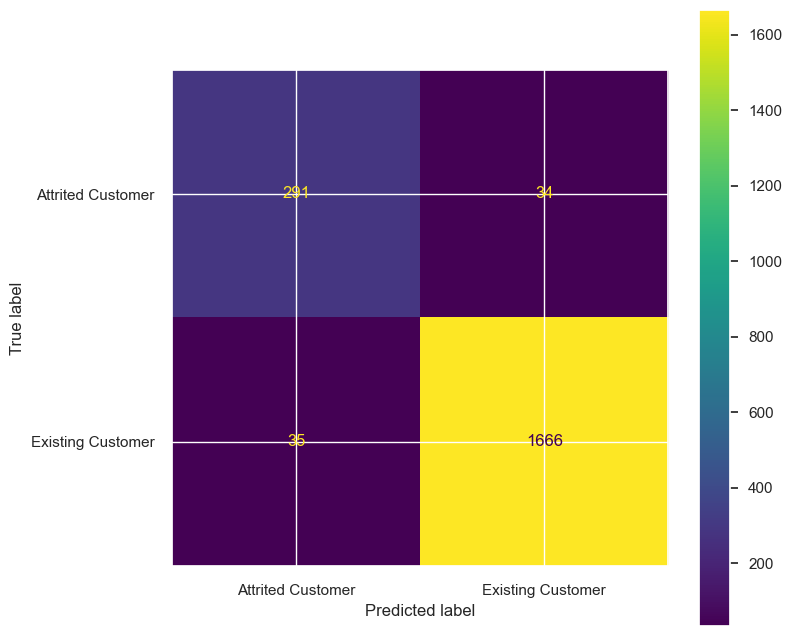

In [318]:
plt.figure(figsize=(8,8));
ConfusionMatrixDisplay.from_estimator(vs1, X_test,y_test, display_labels=cls, ax=plt.subplot());

# Comparación Final

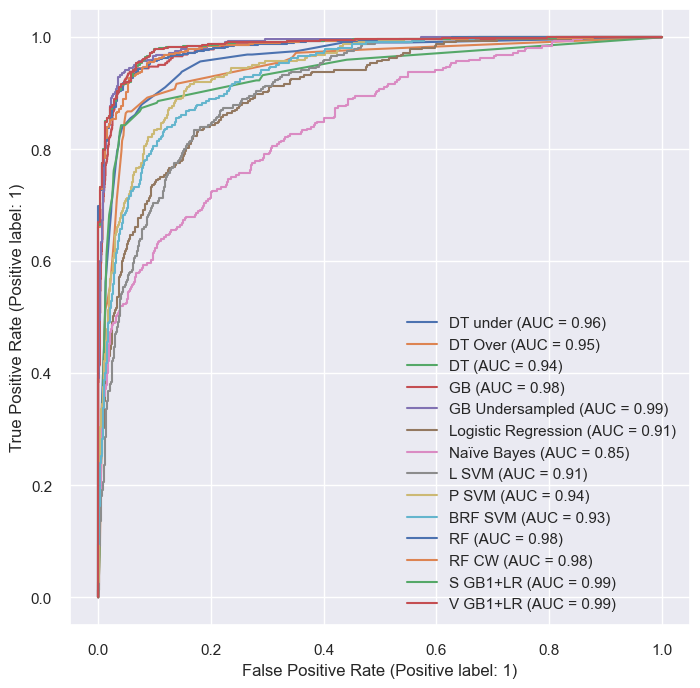

In [320]:
plt.figure(figsize=(8,8));
RocCurveDisplay.from_estimator(dt_us_bs, X_test,y_test, pos_label=0, ax=plt.subplot(), name="DT under");
RocCurveDisplay.from_estimator(dt_os_bs, X_test,y_test, pos_label=0, ax=plt.subplot(), name="DT Over");
RocCurveDisplay.from_estimator(dt_bs, X_test,y_test, pos_label=0, ax=plt.subplot(), name="DT");
RocCurveDisplay.from_estimator(gb_bs, X_test,y_test, pos_label=0, ax=plt.subplot(), name="GB");
RocCurveDisplay.from_estimator(gb_bs1, X_test,y_test, pos_label=0, ax=plt.subplot(), name="GB Undersampled");
RocCurveDisplay.from_estimator(lr_gs, X_test_sd,y_test, pos_label=0, ax=plt.subplot(), name="Logistic Regression");
RocCurveDisplay.from_estimator(gnb_model, X_test_sd,y_test, pos_label=0, ax=plt.subplot(),name="Naïve Bayes");
RocCurveDisplay.from_estimator(lsvc_gs, X_test_sd,y_test, pos_label=0, ax=plt.subplot(), name="L SVM");
RocCurveDisplay.from_estimator(psvc_gs, X_test_sd,y_test, pos_label=0, ax=plt.subplot(),name="P SVM");
RocCurveDisplay.from_estimator(rbsvc_gs, X_test_sd,y_test, pos_label=0, ax=plt.subplot(),name="BRF SVM");
RocCurveDisplay.from_estimator(rf_bs, X_test,y_test, pos_label=1, ax=plt.subplot(), name="RF");
RocCurveDisplay.from_estimator(rf_cw_bs, X_test,y_test, pos_label=1, ax=plt.subplot(), name="RF CW");
RocCurveDisplay.from_estimator(st1, X_test,y_test, pos_label=1, ax=plt.subplot(), name='S GB1+LR');
RocCurveDisplay.from_estimator(vs1, X_test,y_test, pos_label=1, ax=plt.subplot(), name='V GB1+LR');

In [321]:
results_df.sort_values(by=['test acc'], ascending=False)

,test acc,precision score (W),recall score (W),f1 score (W),ROC AUC,True Positives,False Positives,False Negatives,True Negatives
Voting GB1+RF CW,0.966,0.966,0.966,0.966,0.986,1666.0,34.0,35.0,291.0
Stacking GB1+RF CW,0.965,0.965,0.965,0.965,0.986,1669.0,39.0,32.0,286.0
Gradient Boosting_Undersampled,0.964,0.964,0.964,0.964,0.985,1664.0,36.0,37.0,289.0
Gradient Boosting,0.954,0.953,0.954,0.953,0.981,1670.0,63.0,31.0,262.0
Random Forest CW,0.954,0.953,0.954,0.954,0.983,1655.0,48.0,46.0,277.0
Random Forest,0.949,0.947,0.949,0.947,0.983,1674.0,77.0,27.0,248.0
Random Forest Undersampled,0.948,0.947,0.948,0.947,0.981,1651.0,56.0,50.0,269.0
DTree under samp,0.940,0.941,0.940,0.940,0.960,1638.0,58.0,63.0,267.0
DTree base,0.940,0.940,0.940,0.940,0.938,1638.0,59.0,63.0,266.0
DTree over samp,0.937,0.940,0.937,0.938,0.948,1622.0,49.0,79.0,276.0
